In [1]:
import requests
import numpy as np
import cv2
import json
from collections import Counter

from IPython.display import Image

from openstreetmap_load_data import load_data_from_openstreetmap

In [2]:
# Нужна функция, которая по одной точке, например (right_top_lat, right_top_lon) найдёт точку (left_bottom_lat, left_bottom_lon)
# и центр (важно, чтобы все картинки были одного размера)

In [3]:
left_bottom_lat_first = 54.4081
left_bottom_lon_first = 48.9805
right_top_lat_first = 54.6480
right_top_lon_first = 49.6781

def calculate_bottom_and_center(right_top_lat, right_top_lon):
    diff_lat = right_top_lat_first - left_bottom_lat_first
    diff_lon = right_top_lon_first - left_bottom_lon_first
    
    left_bottom_lat = right_top_lat - diff_lat
    left_bottom_lon = right_top_lon - diff_lon
    
    center = [(right_top_lat + left_bottom_lat) / 2, (right_top_lon + left_bottom_lon) / 2]
    
    return left_bottom_lat, left_bottom_lon, center

right_top_lat = right_top_lat_first
right_top_lon = right_top_lon_first

left_bottom_lat, left_bottom_lon, center = calculate_bottom_and_center(right_top_lat, right_top_lon)
# print(right_top_lat, right_top_lon)
# print(left_bottom_lat, left_bottom_lon, center)

marker_right_top = ','.join(map(str, [right_top_lat, right_top_lon]))
# print(marker_right_top)
marker_left_bottom = ','.join(map(str, [left_bottom_lat, left_bottom_lon]))
# print(marker_left_bottom)

center_str = ','.join(map(str, center))
# print(center_str)

In [4]:
# Загрузка картинки с google maps

url = "https://maps.googleapis.com/maps/api/staticmap?"

def load_google_maps_img(center, marker_left_bottom, marker_right_top):
    """
    Загружает 2 изображения, отличающихся только тем, что на одном из них есть маркеры границ, а на другом нет
    Маркеры соответствуют границам карты, загруженной с помощью openStreetMaps
    
    Примеры передаваемых параметров:
    center = "54.52805,49.3291"
    marker_left_bottom = "54.4081,48.9805"
    marker_right_top = "54.6480,49.6781"
    """

    r1 = requests.get(url + "center=" + center + "&zoom=10&size=600x600&key=" + api_key + "&sensor=false" \
                     +"&markers=color:blue%7Clabel:L%7C" + marker_left_bottom \
                     +"&markers=color:blue%7Clabel:R%7C" + marker_right_top) 
    
    with open('tmp_with_markers.png', 'wb') as f:
        f.write(r1.content) 

    r2 = requests.get(url + "center=" + center + "&zoom=10&size=600x600&key=" + api_key + "&sensor=false") 
    with open('tmp_orig.png', 'wb') as f:
        f.write(r2.content) 
    
    return cv2.imread("tmp_orig.png").astype(np.int8), cv2.imread("tmp_with_markers.png").astype(np.int8)
    
img_orig, img_with_markers = load_google_maps_img(center=center_str,
                                                  marker_left_bottom=marker_left_bottom,
                                                  marker_right_top=marker_right_top)


In [5]:
print(img_orig.shape, img_with_markers.shape)

(600, 600, 3) (600, 600, 3)


In [6]:
def load_satellite_image(center):
    r = requests.get(url + "center=" + center + "&zoom=10&size=600x600&key=" 
                     + api_key + "&sensor=false&maptype=satellite")
    with open("tmp_orig_satellite.png", 'wb') as f:
        f.write(r.content)
    
    return cv2.imread("tmp_orig_satellite.png")

img_satellite = load_satellite_image(center=center_str)
print(img_satellite.shape)

(600, 600, 3)


In [7]:
cv2.imwrite("iiiiii_orig.png", img_orig)
cv2.imwrite("iiiiii_with_markers.png", img_with_markers)

# cv2.imwrite("iiiii_diff.png", (cv2.imread("img_with_markers.png") - cv2.imread("img_orig.png")))

cv2.imwrite("iiiii_diff.png", np.absolute(img_with_markers - img_orig))

True

In [8]:
img_diff = cv2.medianBlur(np.absolute(img_with_markers - img_orig).astype(np.uint8), 5)
cv2.imwrite("tmp_diff.png", img_diff)

True

In [9]:
# Дальше нужно найти реальные границы изображения и обрезать его

def find_borders_and_cut_img(img_orig, img_with_markers, img_satellite):
    """
    Используя картинку с маркерами определяет используемые границы изображения, возвращает картинку, обрезанную по этим границам
    """
    img_diff = cv2.medianBlur(np.absolute(img_with_markers - img_orig).astype(np.uint8), 5)
    cv2.imwrite("tmp_diff.png", img_diff)
    
    img_grey = img_diff.mean(axis=2)
    cv2.imwrite("tmp_grey.png", img_grey)
    
    def find_bottom(img_grey, start_height):
        # Поднимаемся наверх по изображению, находим первую не чёрную точку - это маркер
        for i in range(start_height)[::-1]:
            for j in range(img_grey.shape[1]):
#                 if img_grey[i][j] != 0:
                if img_grey[i][j] > 1:    
                    return (i, j)
                
    # Поиск левой нижней границы
    i, j = find_bottom(img_grey, img_grey.shape[0])
    print(i, j)
    # Поиск правой верхней границы
    k, m = find_bottom(img_grey, img_grey.shape[0] // 2)
    print(k, m)
    img_diff[i-2, j] = [0, 0, 255]  # Сдвиг -2, чтобы точка была ближе к середине кончика маркера
    img_diff[k-2, m] = [0, 0, 255]
    
    # Теперь можно обрезать оригинальную картинку
    img_cutted = img_orig[(k - 2):(i - 2), j:m]
    cv2.imwrite("tmp_cutted_orig.png", img_cutted)
    
    # И картинку со спутника
    img_cutted_satellite = img_satellite[(k - 2):(i - 2), j:m]
    cv2.imwrite("tmp_cutted_satellite.png", img_cutted_satellite)
    
    return img_cutted, img_cutted_satellite

img_cutted, img_cutted_satellite = find_borders_and_cut_img(img_orig, img_with_markers, img_satellite)
print(img_cutted.shape, img_cutted_satellite.shape)

450 45
149 553
(301, 508, 3) (301, 508, 3)


In [158]:
# Дальше можно загрузить json с описанием объектов и вытащить из него эти объекты
def find_objects_bounds(datafile_name, right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon):
    """
    Определяет границы объектов. Удаляет слишком маленькие, слишком большие и вложенные в другие объекты одного типа
    """
    with open(datafile_name) as json_data:
#     with open('data_water_wood_peak_valley_ridge.json') as json_data:
        data = json.load(json_data)
        
#     print(data)
    
    bounds = []
    tags = []
    
#     print("data len:", len(data))
#     print("all elements count:", len(data['elements']))
    
    img_lat_diff = abs(right_top_lat - left_bottom_lat)
    img_lon_diff = abs(right_top_lon - left_bottom_lon)
#     print(img_lat_diff, img_lon_diff)

    for element in data['elements']:
        
        if element['tags']['natural'] == 'ridge':
            print("RIDGE")
        
        el_type = element['type']
        if el_type == 'node':
            print(element)
            lat, lon = (element['lat'], element['lon'])
            maxlat = lat + 0.01 * img_lat_diff
            minlat = lat - 0.01 * img_lat_diff
            maxlon = lon + 0.01 * img_lon_diff
            minlon = lon - 0.01 * img_lon_diff
        else:
            el_bounds = element['bounds']
            maxlat, maxlon, minlat, minlon = (el_bounds['maxlat'], el_bounds['maxlon'], el_bounds['minlat'], el_bounds['minlon'])
        # Здесь нужно также проверить, что площать элемента не слишком маленькая или не слишком большая
        # Рассматривать объекты будем только в пределах картинки
        maxlat = np.clip(maxlat, left_bottom_lat, right_top_lat)
        minlat = np.clip(minlat, left_bottom_lat, right_top_lat)
        maxlon = np.clip(maxlon, left_bottom_lon, right_top_lon)
        minlon = np.clip(minlon, left_bottom_lon, right_top_lon)

        el_bounds = {'maxlat': maxlat, 'minlat': minlat, 'maxlon': maxlon, 'minlon': minlon}
#         print(el_bounds)
        lat_diff, lon_diff = (abs(maxlat - minlat), abs(maxlon - minlon))
        # Слишком маленькие и слишком большие объекты добавлять не будем
        if lat_diff >= img_lat_diff * 0.001 and lon_diff >= img_lon_diff * 0.001 \
            and lat_diff <= img_lat_diff * 0.999 and lon_diff <= img_lon_diff * 0.999:
        
            bounds.append(el_bounds)
            tags.append(element['tags']['natural'])

    # Здесь отбираются контуры - показываются только контуры одного типа, не содержащиеся в других объектах
    cur_max_objects = []
    cur_tags = []
    for element_idx in range(len(bounds)):
        element = bounds[element_idx]
        tag = tags[element_idx]
        maxlat, maxlon, minlat, minlon = (element['maxlat'], element['maxlon'], element['minlat'], element['minlon'])
        
        is_to_append = True
        
        for cur_max_object_idx in range(len(cur_max_objects)):
            cur_max_object = cur_max_objects[cur_max_object_idx]
            maxlat_cur_max, maxlon_cur_max = (cur_max_object['maxlat'], cur_max_object['maxlon'])
            minlat_cur_max, minlon_cur_max = (cur_max_object['minlat'], cur_max_object['minlon'])
            
            # Проверим, не содержится ли текущий максимальный объект в новом element
            if maxlat_cur_max <= maxlat and minlat_cur_max >= minlat and maxlon_cur_max <= maxlon and minlon_cur_max >= minlon\
                and tag == cur_tags[cur_max_object_idx]:
                cur_max_objects[cur_max_object_idx] = element
                cur_tags[cur_max_object_idx] = tag
                is_to_append = False
        if is_to_append:
            cur_max_objects.append(element)
            cur_tags.append(tag)

    return cur_max_objects, cur_tags

In [22]:
bounds, tags = find_objects_bounds('data_water_wood_peak_valley_ridge.json',
                                   right_top_lat_first, right_top_lon_first, left_bottom_lat_first, left_bottom_lon_first)

all elements count: 662
{'maxlat': 54.648, 'minlat': 54.6400339, 'maxlon': 48.985209, 'minlon': 48.9805}
{'maxlat': 54.4186171, 'minlat': 54.414501, 'maxlon': 49.2543968, 'minlon': 49.250208}
{'maxlat': 54.4210935, 'minlat': 54.4200398, 'maxlon': 49.2699455, 'minlon': 49.2676775}
{'maxlat': 54.4955667, 'minlat': 54.484179, 'maxlon': 49.6188467, 'minlon': 49.6014683}
{'maxlat': 54.4701444, 'minlat': 54.4647504, 'maxlon': 49.6781, 'minlon': 49.6560522}
{'maxlat': 54.469113, 'minlat': 54.4638409, 'maxlon': 49.6497588, 'minlon': 49.6434737}
{'maxlat': 54.5889796, 'minlat': 54.5884449, 'maxlon': 49.5700633, 'minlon': 49.5692376}
{'maxlat': 54.5774028, 'minlat': 54.5771425, 'maxlon': 49.0081661, 'minlon': 49.0075689}
{'maxlat': 54.583206, 'minlat': 54.5829505, 'maxlon': 49.0411025, 'minlon': 49.0407119}
{'maxlat': 54.5921606, 'minlat': 54.591562, 'maxlon': 49.0690223, 'minlon': 49.0680476}
{'maxlat': 54.5888649, 'minlat': 54.5878481, 'maxlon': 49.0606931, 'minlon': 49.059056}
{'maxlat': 54.6

In [23]:
Counter(tags)

Counter({'water': 33, 'wood': 449})

In [24]:
bounds[0]

{'maxlat': 54.648,
 'minlat': 54.6400339,
 'maxlon': 48.985209,
 'minlon': 48.9805}

In [83]:
def calculate_one_pixels_diffs(right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon, img_cutted_shape):
    """
    Возвращает разницу в lat на 1 пиксель и разницу в lon на 1 пиксель для обрезанной картинки
    """
    return (abs((left_bottom_lat - right_top_lat) / img_cutted_shape[0]),
        abs((right_top_lon - left_bottom_lon) / img_cutted_shape[1]))

one_pixel_lat_diff, one_pixel_lon_diff = calculate_one_pixels_diffs(right_top_lat, right_top_lon,
                                                                    left_bottom_lat, left_bottom_lon,
                                                                    img_cutted.shape)
print(one_pixel_lat_diff, one_pixel_lon_diff)

0.0007970099667774279 0.0013732283464566956


In [143]:
def draw_rectangle_for_element_idx(idx, bounds, img_cutted, color_rgb_code,
                                  right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                  one_pixel_lat_diff, one_pixel_lon_diff):
    
    bounds_cur = bounds[idx]
    print(bounds_cur)
    maxlat_cur = bounds_cur['maxlat']
    maxlon_cur = bounds_cur['maxlon']
    minlat_cur = bounds_cur['minlat']
    minlon_cur = bounds_cur['minlon']
    
    minlat_cur_pixel = img_cutted.shape[0] - int(round((minlat_cur - left_bottom_lat) / one_pixel_lat_diff, 0))
    maxlat_cur_pixel = int(round((right_top_lat - maxlat_cur) / one_pixel_lat_diff, 0))

    minlon_cur_pixel = int(round((minlon_cur - left_bottom_lon) / one_pixel_lon_diff, 0))
    maxlon_cur_pixel = img_cutted.shape[1] - int(round((right_top_lon - maxlon_cur) / one_pixel_lon_diff, 0))
    
#     print("maxlat:", maxlat_cur_pixel)
#     print("minlat:", minlat_cur_pixel)
    
    img_cutted_shape = img_cutted.shape
    maxlat_cur_pixel = np.clip(maxlat_cur_pixel, 0, img_cutted_shape[0] - 1)
    minlat_cur_pixel = np.clip(minlat_cur_pixel, 0, img_cutted_shape[0] - 1)
        
#     print("minlon:", minlon_cur_pixel)
#     print("maxlon:", maxlon_cur_pixel)
    
    maxlon_cur_pixel = np.clip(maxlon_cur_pixel, 0, img_cutted_shape[1] - 1)
    minlon_cur_pixel = np.clip(minlon_cur_pixel, 0, img_cutted_shape[1] - 1)
    
    print(maxlat_cur_pixel, minlat_cur_pixel, maxlon_cur_pixel, minlon_cur_pixel)
    
    if minlat_cur_pixel != maxlat_cur_pixel and minlon_cur_pixel != maxlon_cur_pixel\
        and (minlat_cur_pixel - maxlat_cur_pixel) > img_cutted.shape[0] * 0.01\
        and (maxlon_cur_pixel - minlon_cur_pixel) > img_cutted.shape[1] * 0.01\
        and (minlat_cur_pixel - maxlat_cur_pixel) < img_cutted.shape[0] * 0.99\
        and (minlat_cur_pixel - maxlat_cur_pixel) < img_cutted.shape[1] * 0.99:
    
        print("Going to show")
    
        for i in range(maxlat_cur_pixel, minlat_cur_pixel):
            img_cutted[i, minlon_cur_pixel] = color_rgb_code
            img_cutted[i, maxlon_cur_pixel] = color_rgb_code

        for i in range(minlon_cur_pixel, maxlon_cur_pixel):
            img_cutted[minlat_cur_pixel, i] = color_rgb_code
            img_cutted[maxlat_cur_pixel, i] = color_rgb_code
            
        print()

    return img_cutted

In [113]:
img_new = draw_rectangle_for_element_idx(0, bounds, img_cutted, [255, 0, 0],
                                         right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                        one_pixel_lat_diff, one_pixel_lon_diff)
# cv2.imwrite("result_img.png", img_new)

{'maxlat': 54.648, 'minlat': 54.6400339, 'maxlon': 48.985209, 'minlon': 48.9805}
0 10 3 0


0 water
{'maxlat': 54.648, 'minlat': 54.6400339, 'maxlon': 48.985209, 'minlon': 48.9805}
0 10 3 0
1 water
{'maxlat': 54.4186171, 'minlat': 54.414501, 'maxlon': 49.2543968, 'minlon': 49.250208}
288 293 199 196
2 water
{'maxlat': 54.4210935, 'minlat': 54.4200398, 'maxlon': 49.2699455, 'minlon': 49.2676775}
285 286 211 209
3 water
{'maxlat': 54.4955667, 'minlat': 54.484179, 'maxlon': 49.6188467, 'minlon': 49.6014683}
191 206 465 452
Going to show

4 water
{'maxlat': 54.4701444, 'minlat': 54.4647504, 'maxlon': 49.6781, 'minlon': 49.6560522}
223 230 507 492
Going to show

5 water
{'maxlat': 54.469113, 'minlat': 54.4638409, 'maxlon': 49.6497588, 'minlon': 49.6434737}
224 231 487 483
6 water
{'maxlat': 54.5889796, 'minlat': 54.5884449, 'maxlon': 49.5700633, 'minlon': 49.5692376}
74 75 429 429
7 water
{'maxlat': 54.5921606, 'minlat': 54.591562, 'maxlon': 49.0690223, 'minlon': 49.0680476}
70 71 64 64
8 water
{'maxlat': 54.5888649, 'minlat': 54.5878481, 'maxlon': 49.0606931, 'minlon': 49.059056}

172 177 91 83
Going to show

209 wood
{'maxlat': 54.509542, 'minlat': 54.5080552, 'maxlon': 49.0113058, 'minlon': 48.9994685}
174 176 22 14
210 wood
{'maxlat': 54.5037731, 'minlat': 54.5026396, 'maxlon': 49.0725898, 'minlon': 49.0705028}
181 182 67 66
211 wood
{'maxlat': 54.5010514, 'minlat': 54.4962248, 'maxlon': 49.1330022, 'minlon': 49.1223963}
184 190 111 103
Going to show

212 wood
{'maxlat': 54.5008692, 'minlat': 54.4991133, 'maxlon': 49.0771857, 'minlon': 49.0751299}
185 187 70 69
213 wood
{'maxlat': 54.5194942, 'minlat': 54.5185521, 'maxlon': 49.0562794, 'minlon': 49.0544893}
161 162 55 54
214 wood
{'maxlat': 54.5097192, 'minlat': 54.5091572, 'maxlon': 49.1170182, 'minlon': 49.1150085}
173 174 99 98
215 wood
{'maxlat': 54.5063124, 'minlat': 54.5010665, 'maxlon': 49.1216737, 'minlon': 49.1087673}
178 184 103 93
Going to show

216 wood
{'maxlat': 54.509412, 'minlat': 54.5069671, 'maxlon': 49.1162524, 'minlon': 49.107765}
174 177 99 93
217 wood
{'maxlat': 54.5087309, 'minlat': 54.

197 198 32 31
413 wood
{'maxlat': 54.4937204, 'minlat': 54.4928817, 'maxlon': 49.0285745, 'minlon': 49.0266457}
194 195 35 34
414 wood
{'maxlat': 54.4928673, 'minlat': 54.4922589, 'maxlon': 49.0270279, 'minlon': 49.0260511}
195 195 34 33
415 wood
{'maxlat': 54.4978381, 'minlat': 54.4971028, 'maxlon': 49.0757132, 'minlon': 49.0727627}
188 189 69 67
416 wood
{'maxlat': 54.4986979, 'minlat': 54.498187, 'maxlon': 49.0772474, 'minlon': 49.0762496}
187 188 70 70
417 wood
{'maxlat': 54.4939093, 'minlat': 54.4928786, 'maxlon': 49.0758685, 'minlon': 49.073384}
193 195 69 68
418 wood
{'maxlat': 54.4955974, 'minlat': 54.4928443, 'maxlon': 49.0837507, 'minlon': 49.0798153}
191 195 75 72
419 wood
{'maxlat': 54.4964049, 'minlat': 54.4958854, 'maxlon': 49.0634386, 'minlon': 49.0607635}
190 191 60 58
420 wood
{'maxlat': 54.4972643, 'minlat': 54.4964379, 'maxlon': 49.064146, 'minlon': 49.063276}
189 190 61 60
421 wood
{'maxlat': 54.4980434, 'minlat': 54.4974673, 'maxlon': 49.0662682, 'minlon': 49.06490

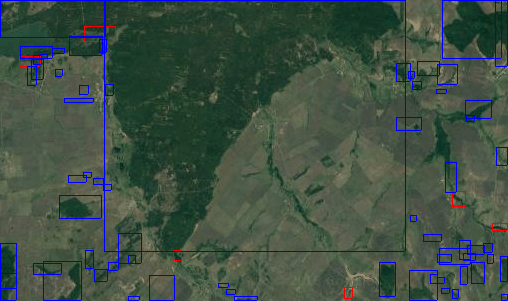

In [144]:
def draw_all_rectangles(img_cutted, bounds, tags, right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                       one_pixel_lat_diff, one_pixel_lon_diff):
    img_new = img_cutted.copy()
    
    for i in range(len(tags)):
        if tags[i] == 'wood':
            print(i, "wood")
            img_new = draw_rectangle_for_element_idx(i, bounds, img_new, [255, 0, 0],
                                                    right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                                    one_pixel_lat_diff, one_pixel_lon_diff)
        if tags[i] == 'water':
            print(i, "water")
            img_new = draw_rectangle_for_element_idx(i, bounds, img_new, [0, 0, 255],
                                                    right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                                    one_pixel_lat_diff, one_pixel_lon_diff)
        if tags[i] == 'peak':
            print(i, "peak")
            img_new = draw_rectangle_for_element_idx(i, bounds, img_new, [0, 255, 255],  # желтый
                                                    right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                                    one_pixel_lat_diff, one_pixel_lon_diff)
        if tags[i] == 'valley': # долина
            print(i, "valley")
            img_new = draw_rectangle_for_element_idx(i, bounds, img_new, [128, 0, 255], 
                                                    right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                                    one_pixel_lat_diff, one_pixel_lon_diff)
        if tags[i] == 'ridge':  # хребет
            print(i, "ridge")
            img_new = draw_rectangle_for_element_idx(i, bounds, img_new, [20, 255, 57],  
                                                    right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                                    one_pixel_lat_diff, one_pixel_lon_diff)
            
    return img_new
    
img_result = draw_all_rectangles(img_cutted_satellite, bounds, tags,
                                 right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                 one_pixel_lat_diff, one_pixel_lon_diff)

cv2.imwrite("images/1.png", img_result)
Image(filename='images/1.png')

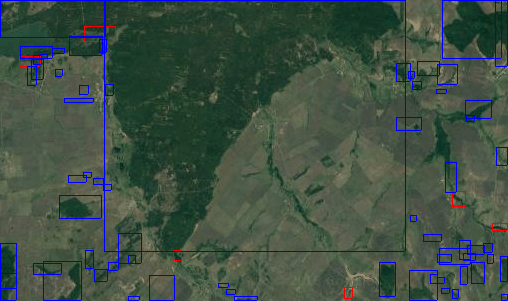

In [29]:
img_new = img_cutted_satellite.copy()

for i in range(len(tags)):
    if tags[i] == 'wood':
#         print("wood", i)
        img_new = draw_rectangle_for_element_idx(i, img_new, [255, 0, 0],
                                                right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                                one_pixel_lat_diff, one_pixel_lon_diff)
    if tags[i] == 'water':
#         print("water", i)
        img_new = draw_rectangle_for_element_idx(i, img_new, [0, 0, 255],
                                                right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                                one_pixel_lat_diff, one_pixel_lon_diff)
cv2.imwrite("images/1.png", img_new)
Image(filename='images/1.png')

In [267]:
def load_data_and_draw_rectangles_on_image(right_top_lat, right_top_lon, result_img_address, json_filename):
    
    # Вычисляем вторую точку на прямоугольнике и центр по поступившим данным о первой точке (right_top_lat, right_top_lon)
    left_bottom_lat, left_bottom_lon, center = calculate_bottom_and_center(right_top_lat, right_top_lon)
    print(left_bottom_lat, left_bottom_lon)
    
    # Загрузка данных из OpenStreetMap
    load_data_from_openstreetmap(left_bottom_lat, left_bottom_lon, right_top_lat, right_top_lon,
                                 json_filename)
    
    # Загрузка 3х картинок из Google Maps (оригинал - карта, оригинал с маркерами, фото со спутника)
    marker_right_top = ','.join(map(str, [right_top_lat, right_top_lon]))
    marker_left_bottom = ','.join(map(str, [left_bottom_lat, left_bottom_lon]))
    center_str = ','.join(map(str, center))
    
    img_orig, img_with_markers = load_google_maps_img(center=center_str,
                                                  marker_left_bottom=marker_left_bottom,
                                                  marker_right_top=marker_right_top)
    img_satellite = load_satellite_image(center=center_str)
        
    # Поиск границ изображения
    img_cutted, img_cutted_satellite = find_borders_and_cut_img(img_orig, img_with_markers, img_satellite)    
    
    print(img_cutted.shape)
    
    # Поиск границ объектов
    bounds, tags = find_objects_bounds(json_filename,
                                       right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon)
    print(right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon)
    print(Counter(tags))
    
    # Рисование прямоугольничков
    one_pixel_lat_diff, one_pixel_lon_diff = calculate_one_pixels_diffs(right_top_lat, right_top_lon,
                                                                    left_bottom_lat, left_bottom_lon,
                                                                    img_cutted.shape)
    img_result = draw_all_rectangles(img_cutted_satellite, bounds, tags,
                                 right_top_lat, right_top_lon, left_bottom_lat, left_bottom_lon,
                                 one_pixel_lat_diff, one_pixel_lon_diff)
    
    # Сохранение картинки в папку
    cv2.imwrite(result_img_address, img_result)

In [268]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=right_top_lat_first,
                                       right_top_lon=right_top_lon_first,
                                       result_img_address="images/1.png",
                                       json_filename="jsons/1.json")

54.4081 48.9805
450 45
149 553
(301, 508, 3)
54.648 49.6781 54.4081 48.9805
Counter({'wood': 449, 'water': 33})
0 water
{'maxlat': 54.648, 'minlat': 54.6400339, 'maxlon': 48.985209, 'minlon': 48.9805}
0 10 3 0
1 water
{'maxlat': 54.4186171, 'minlat': 54.414501, 'maxlon': 49.2543968, 'minlon': 49.250208}
288 293 199 196
2 water
{'maxlat': 54.4210935, 'minlat': 54.4200398, 'maxlon': 49.2699455, 'minlon': 49.2676775}
285 286 211 209
3 water
{'maxlat': 54.4955667, 'minlat': 54.484179, 'maxlon': 49.6188467, 'minlon': 49.6014683}
191 206 465 452
Going to show

4 water
{'maxlat': 54.4701444, 'minlat': 54.4647504, 'maxlon': 49.6781, 'minlon': 49.6560522}
223 230 507 492
Going to show

5 water
{'maxlat': 54.469113, 'minlat': 54.4638409, 'maxlon': 49.6497588, 'minlon': 49.6434737}
224 231 487 483
6 water
{'maxlat': 54.5889796, 'minlat': 54.5884449, 'maxlon': 49.5700633, 'minlon': 49.5692376}
74 75 429 429
7 water
{'maxlat': 54.5921606, 'minlat': 54.591562, 'maxlon': 49.0690223, 'minlon': 49.0680

Going to show

127 wood
{'maxlat': 54.6049614, 'minlat': 54.6017622, 'maxlon': 49.0364073, 'minlon': 49.0329835}
54 58 41 38
128 wood
{'maxlat': 54.6039402, 'minlat': 54.5973371, 'maxlon': 49.0364349, 'minlon': 49.025449}
55 64 41 33
Going to show

129 wood
{'maxlat': 54.6039402, 'minlat': 54.5973371, 'maxlon': 49.0364349, 'minlon': 49.025449}
55 64 41 33
Going to show

130 wood
{'maxlat': 54.6039402, 'minlat': 54.5973371, 'maxlon': 49.0364349, 'minlon': 49.025449}
55 64 41 33
Going to show

131 wood
{'maxlat': 54.6039402, 'minlat': 54.5973371, 'maxlon': 49.0364349, 'minlon': 49.025449}
55 64 41 33
Going to show

132 wood
{'maxlat': 54.6033045, 'minlat': 54.6029102, 'maxlon': 49.0449953, 'minlon': 49.0433671}
56 57 47 46
133 wood
{'maxlat': 54.5908098, 'minlat': 54.5897453, 'maxlon': 49.0678814, 'minlon': 49.0667449}
72 73 64 63
134 wood
{'maxlat': 54.5991876, 'minlat': 54.5969784, 'maxlon': 49.0536363, 'minlon': 49.0508398}
61 64 53 51
135 wood
{'maxlat': 54.5943343, 'minlat': 54.5921


324 wood
{'maxlat': 54.4166011, 'minlat': 54.4146405, 'maxlon': 49.5857966, 'minlon': 49.584211}
290 293 441 440
325 wood
{'maxlat': 54.4219881, 'minlat': 54.4166876, 'maxlon': 49.5842818, 'minlon': 49.5800985}
284 290 440 437
326 wood
{'maxlat': 54.4269092, 'minlat': 54.4222229, 'maxlon': 49.590716, 'minlon': 49.5802754}
277 283 444 437
Going to show

327 wood
{'maxlat': 54.4297998, 'minlat': 54.4222558, 'maxlon': 49.5799569, 'minlon': 49.5715194}
274 283 437 430
Going to show

328 wood
{'maxlat': 54.4266004, 'minlat': 54.4263245, 'maxlon': 49.5767504, 'minlon': 49.5758514}
278 278 434 434
329 wood
{'maxlat': 54.4242699, 'minlat': 54.4223493, 'maxlon': 49.5700026, 'minlon': 49.5674251}
281 283 429 427
330 wood
{'maxlat': 54.4198878, 'minlat': 54.4179369, 'maxlon': 49.5744238, 'minlon': 49.5727052}
286 289 433 431
331 wood
{'maxlat': 54.4187417, 'minlat': 54.4166441, 'maxlon': 49.6012565, 'minlon': 49.5972332}
288 290 452 449
332 wood
{'maxlat': 54.4173309, 'minlat': 54.4104257, 'maxl

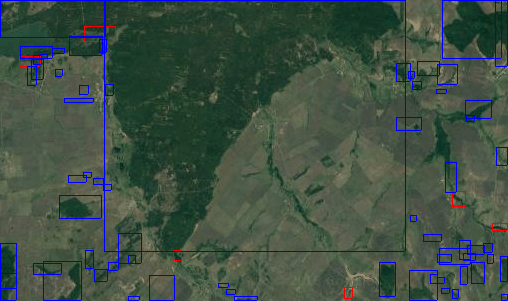

In [269]:
Image(filename='images/1.png')

In [270]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=52.6480,
                                       right_top_lon=47.6781,
                                       result_img_address="images/2.png",
                                       json_filename="jsons/2.json")

52.4081 46.9805
442 46
155 554
(287, 508, 3)
52.648 47.6781 52.4081 46.9805
Counter({'wood': 178, 'water': 7})
0 water
{'maxlat': 52.5064452, 'minlat': 52.50542, 'maxlon': 47.5291037, 'minlon': 47.5264021}
169 171 399 398
1 water
{'maxlat': 52.4303327, 'minlat': 52.4269669, 'maxlon': 47.2377803, 'minlon': 47.2347655}
260 264 187 185
2 water
{'maxlat': 52.441809, 'minlat': 52.4406873, 'maxlon': 47.1860747, 'minlon': 47.1842991}
247 248 150 148
3 water
{'maxlat': 52.4882651, 'minlat': 52.4809213, 'maxlon': 47.0735568, 'minlon': 47.069056}
191 200 68 64
4 water
{'maxlat': 52.5792677, 'minlat': 52.5785971, 'maxlon': 47.2214304, 'minlon': 47.2186421}
82 83 175 173
5 water
{'maxlat': 52.5786285, 'minlat': 52.5783109, 'maxlon': 47.2233797, 'minlon': 47.2221482}
83 83 177 176
6 water
{'maxlat': 52.6207019, 'minlat': 52.6192677, 'maxlon': 47.2418854, 'minlon': 47.2384306}
33 34 190 188
7 wood
{'maxlat': 52.6166641, 'minlat': 52.5189396, 'maxlon': 47.380355, 'minlon': 47.2127649}
37 154 291 169


167 wood
{'maxlat': 52.6099465, 'minlat': 52.6074056, 'maxlon': 47.093052, 'minlon': 47.0835034}
46 49 82 75
Going to show

168 wood
{'maxlat': 52.6074577, 'minlat': 52.6037438, 'maxlon': 47.096893, 'minlon': 47.0853487}
49 53 85 76
Going to show

169 wood
{'maxlat': 52.606086, 'minlat': 52.5315353, 'maxlon': 47.1002701, 'minlon': 46.9805}
50 139 87 0
Going to show

170 wood
{'maxlat': 52.606086, 'minlat': 52.5315353, 'maxlon': 47.1002701, 'minlon': 46.9805}
50 139 87 0
Going to show

171 wood
{'maxlat': 52.606086, 'minlat': 52.5315353, 'maxlon': 47.1002701, 'minlon': 46.9805}
50 139 87 0
Going to show

172 wood
{'maxlat': 52.4521372, 'minlat': 52.4380283, 'maxlon': 47.0632839, 'minlon': 47.0410538}
234 251 60 44
Going to show

173 wood
{'maxlat': 52.4536999, 'minlat': 52.4470631, 'maxlon': 47.0862437, 'minlon': 47.0777035}
232 240 77 71
Going to show

174 wood
{'maxlat': 52.4990897, 'minlat': 52.4847182, 'maxlon': 47.1394554, 'minlon': 47.1197787}
178 195 116 101
Going to show

175 wo

In [271]:
## Возможно, вторая точка оказалась где-то не там, где должна была оказаться - проверить!

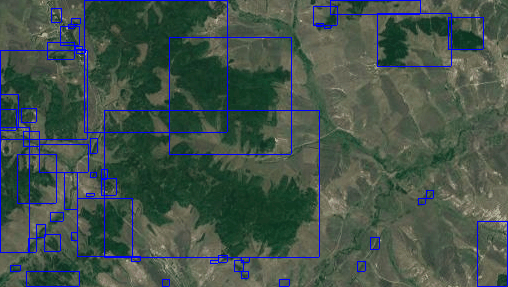

In [273]:
Image(filename='images/2.png')

In [274]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=50.6480,
                                       right_top_lon=45.6781,
                                       result_img_address="images/3.png",
                                       json_filename="jsons/3.json")

50.4081 44.9805
436 45
162 553
(274, 508, 3)
50.648 45.6781 50.4081 44.9805
Counter({'wood': 106, 'water': 32})
0 water
{'maxlat': 50.5066893, 'minlat': 50.5031923, 'maxlon': 45.5698804, 'minlon': 45.5580996}
161 165 429 421
Going to show

1 water
{'maxlat': 50.5093588, 'minlat': 50.5047319, 'maxlon': 45.4731792, 'minlon': 45.4657906}
158 164 359 353
Going to show

2 water
{'maxlat': 50.4897057, 'minlat': 50.4828722, 'maxlon': 45.3018502, 'minlon': 45.28097}
181 189 234 219
Going to show

3 water
{'maxlat': 50.4264425, 'minlat': 50.4168973, 'maxlon': 45.2115732, 'minlon': 45.200389}
253 264 168 160
Going to show

4 water
{'maxlat': 50.424374, 'minlat': 50.4236746, 'maxlon': 45.1921099, 'minlon': 45.189187}
255 256 154 152
5 water
{'maxlat': 50.4168474, 'minlat': 50.4156924, 'maxlon': 45.1665643, 'minlon': 45.1643778}
264 265 135 134
6 water
{'maxlat': 50.466414, 'minlat': 50.4621762, 'maxlon': 45.1686151, 'minlon': 45.1571016}
207 212 137 129
Going to show

7 water
{'maxlat': 50.483888

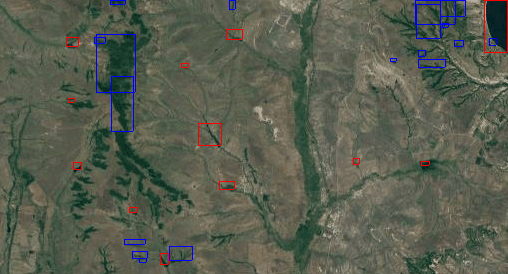

In [275]:
Image(filename='images/3.png')

In [276]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=40.6480,
                                       right_top_lon=39.6781,
                                       result_img_address="images/4.png",
                                       json_filename="jsons/4.json")

40.4081 38.9805
414 45
184 553
(230, 508, 3)
{'type': 'node', 'id': 1836755801, 'lat': 40.455719, 'lon': 39.212326, 'tags': {'name': 'Alitaşı Tepesi', 'natural': 'peak'}}
{'type': 'node', 'id': 1836755847, 'lat': 40.5333709, 'lon': 39.4749088, 'tags': {'name': 'Bozbent Dağı', 'natural': 'peak'}}
{'type': 'node', 'id': 2297425732, 'lat': 40.4416321, 'lon': 39.5511441, 'tags': {'name': 'Arsabaşı Tepesi', 'natural': 'peak'}}
{'type': 'node', 'id': 2305472683, 'lat': 40.5953718, 'lon': 39.4020347, 'tags': {'name': 'Ayliye Tepesi', 'natural': 'peak'}}
{'type': 'node', 'id': 2305472736, 'lat': 40.587391, 'lon': 39.59956, 'tags': {'name': 'Kolat Dağları', 'natural': 'peak'}}
{'type': 'node', 'id': 2305472741, 'lat': 40.618504, 'lon': 39.641224, 'tags': {'name': 'Taşkesen Tepesi', 'natural': 'peak'}}
{'type': 'node', 'id': 2305472750, 'lat': 40.622391, 'lon': 39.460945, 'tags': {'name': 'Yayla Tepesi', 'natural': 'peak'}}
{'type': 'node', 'id': 2305472757, 'lat': 40.573223, 'lon': 39.551498, '

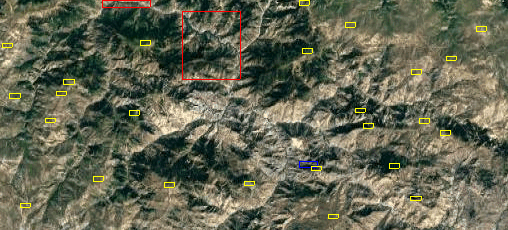

In [277]:
Image(filename='images/4.png')

In [278]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=39.6480,
                                       right_top_lon=35.6381,
                                       result_img_address="images/5.png",
                                       json_filename="jsons/5.json")

39.4081 34.9405
412 45
186 553
(226, 508, 3)
{'type': 'node', 'id': 1934130271, 'lat': 39.468464, 'lon': 35.412228, 'tags': {'name': 'Beş Tepe', 'natural': 'peak'}}
{'type': 'node', 'id': 2061489843, 'lat': 39.459576, 'lon': 35.468895, 'tags': {'name': 'Boz Tepe', 'natural': 'peak'}}
{'type': 'node', 'id': 2061490761, 'lat': 39.4128173, 'lon': 35.3858023, 'tags': {'name': 'İnce Tepe', 'natural': 'peak'}}
{'type': 'node', 'id': 2304837336, 'lat': 39.515408, 'lon': 35.605843, 'tags': {'name': 'Gökkaya Tepesi', 'natural': 'peak'}}
{'type': 'node', 'id': 2304837343, 'lat': 39.435688, 'lon': 35.637516, 'tags': {'name': 'Karakuzey Tepesi', 'natural': 'peak'}}
{'type': 'node', 'id': 2304837345, 'lat': 39.487076, 'lon': 35.613068, 'tags': {'name': 'Lalesivri Tepesi', 'natural': 'peak'}}
{'type': 'node', 'id': 2308610368, 'lat': 39.5904262, 'lon': 35.0219617, 'tags': {'name': 'Karakaya Tepesi', 'natural': 'peak', 'source': 'cyclemap'}}
{'type': 'node', 'id': 2319191247, 'lat': 39.646801, 'lon':

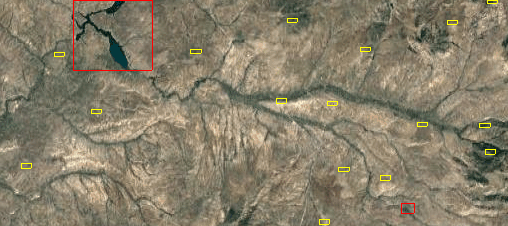

In [279]:
Image(filename='images/5.png')

In [280]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=53.6480,
                                       right_top_lon=48.6381,
                                       result_img_address="images/6.png",
                                       json_filename="jsons/6.json")

53.4081 47.9405
446 46
152 554
(294, 508, 3)
{'type': 'node', 'id': 4333969670, 'lat': 53.5000959, 'lon': 48.3380078, 'tags': {'natural': 'peak', 'peak': 'hill'}}
{'type': 'node', 'id': 4333969672, 'lat': 53.501042, 'lon': 48.3329666, 'tags': {'natural': 'peak', 'peak': 'hill'}}
53.648 48.6381 53.4081 47.9405
Counter({'wood': 128, 'water': 12, 'peak': 2})
0 water
{'maxlat': 53.473959, 'minlat': 53.473557, 'maxlon': 48.5728175, 'minlon': 48.571936}
213 214 460 460
1 water
{'maxlat': 53.4816676, 'minlat': 53.4804577, 'maxlon': 48.1124709, 'minlon': 48.1114034}
204 205 125 124
2 water
{'maxlat': 53.5297702, 'minlat': 53.5293026, 'maxlon': 47.9624004, 'minlon': 47.9592431}
145 145 16 14
3 water
{'maxlat': 53.4148345, 'minlat': 53.4142909, 'maxlon': 48.4007559, 'minlon': 48.3994551}
286 286 335 334
4 water
{'maxlat': 53.5013506, 'minlat': 53.5002467, 'maxlon': 48.4984951, 'minlon': 48.4967473}
180 181 406 405
5 water
{'maxlat': 53.4859022, 'minlat': 53.4833196, 'maxlon': 48.1168391, 'minlon

134 wood
{'maxlat': 53.648, 'minlat': 53.6054422, 'maxlon': 48.3214286, 'minlon': 48.0638966}
0 52 277 90
Going to show

135 wood
{'maxlat': 53.648, 'minlat': 53.5797672, 'maxlon': 48.1134224, 'minlon': 48.0417304}
0 84 126 74
Going to show

136 wood
{'maxlat': 53.4888099, 'minlat': 53.4284258, 'maxlon': 48.1475345, 'minlon': 48.0208843}
195 269 151 59
Going to show

137 wood
{'maxlat': 53.5102028, 'minlat': 53.4984156, 'maxlon': 48.1909222, 'minlon': 48.1800338}
169 183 182 174
Going to show

138 wood
{'maxlat': 53.6466963, 'minlat': 53.6228476, 'maxlon': 48.4195341, 'minlon': 48.3916307}
2 31 349 329
Going to show

139 wood
{'maxlat': 53.648, 'minlat': 53.639207, 'maxlon': 48.4116417, 'minlon': 48.3923395}
0 11 343 329
Going to show

140 peak
{'maxlat': 53.502494899999995, 'minlat': 53.4976969, 'maxlon': 48.3449838, 'minlon': 48.3310318}
178 184 295 284
Going to show

141 peak
{'maxlat': 53.503440999999995, 'minlat': 53.498643, 'maxlon': 48.3399426, 'minlon': 48.3259906}
177 183 291 

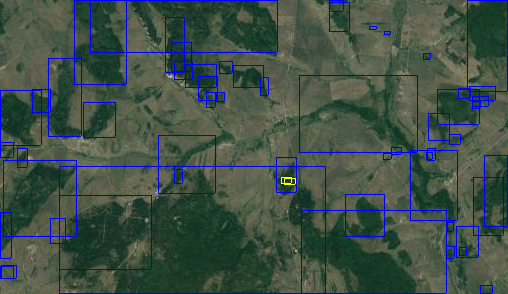

In [281]:
Image(filename='images/6.png')

In [282]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=53.6480,
                                       right_top_lon=54.6381,
                                       result_img_address="images/7.png",
                                       json_filename="jsons/7.json")

53.4081 53.9405
446 46
152 554
(294, 508, 3)
53.648 54.6381 53.4081 53.9405
Counter({'wood': 270, 'water': 16})
0 water
{'maxlat': 53.5927941, 'minlat': 53.578073, 'maxlon': 54.001485, 'minlon': 53.9908935}
68 86 44 37
Going to show

1 water
{'maxlat': 53.6130041, 'minlat': 53.6104197, 'maxlon': 54.1856677, 'minlon': 54.1824786}
43 46 179 176
2 water
{'maxlat': 53.5197297, 'minlat': 53.518416, 'maxlon': 54.0818487, 'minlon': 54.0788007}
157 159 103 101
3 water
{'maxlat': 53.5249838, 'minlat': 53.5223014, 'maxlon': 54.094959, 'minlon': 54.0918578}
151 154 112 110
4 water
{'maxlat': 53.5137251, 'minlat': 53.5113552, 'maxlon': 54.2858398, 'minlon': 54.2810437}
165 167 251 248
5 water
{'maxlat': 53.6172012, 'minlat': 53.6146388, 'maxlon': 54.5328348, 'minlon': 54.5320439}
38 41 431 431
6 water
{'maxlat': 53.6203115, 'minlat': 53.6193221, 'maxlon': 54.5355349, 'minlon': 54.5345835}
34 35 433 433
7 water
{'maxlat': 53.619325, 'minlat': 53.6183966, 'maxlon': 54.5362291, 'minlon': 54.5352138}


46 67 290 267
Going to show

188 wood
{'maxlat': 53.6102607, 'minlat': 53.5934474, 'maxlon': 54.3382409, 'minlon': 54.30649}
46 67 290 267
Going to show

189 wood
{'maxlat': 53.6096043, 'minlat': 53.6092978, 'maxlon': 54.310891, 'minlon': 54.3037843}
47 47 270 265
190 wood
{'maxlat': 53.5928324, 'minlat': 53.5901604, 'maxlon': 54.2961255, 'minlon': 54.2883605}
68 71 259 253
Going to show

191 wood
{'maxlat': 53.5900554, 'minlat': 53.589005, 'maxlon': 54.2909229, 'minlon': 54.2870156}
71 72 255 252
192 wood
{'maxlat': 53.5900596, 'minlat': 53.5891773, 'maxlon': 54.2949717, 'minlon': 54.2939737}
71 72 258 257
193 wood
{'maxlat': 53.5885644, 'minlat': 53.5880708, 'maxlon': 54.2956843, 'minlon': 54.2949547}
73 73 259 258
194 wood
{'maxlat': 53.5882373, 'minlat': 53.5875622, 'maxlon': 54.2863889, 'minlon': 54.285214}
73 74 252 251
195 wood
{'maxlat': 53.5913909, 'minlat': 53.5846262, 'maxlon': 54.3544521, 'minlon': 54.3401739}
69 78 301 291
Going to show

196 wood
{'maxlat': 53.5919289, 'mi

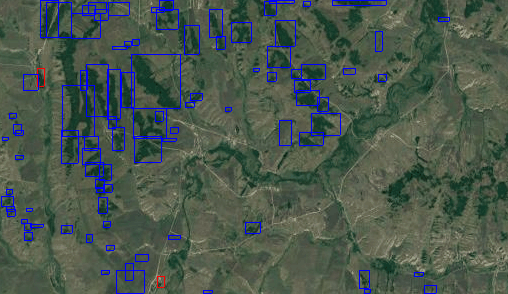

In [283]:
Image(filename='images/7.png')

In [284]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=53.6480,
                                       right_top_lon=58.6781,
                                       result_img_address="images/8.png",
                                       json_filename="jsons/8.json")

53.4081 57.9805
446 46
151 553
(295, 507, 3)
{'type': 'node', 'id': 1835374799, 'lat': 53.5980293, 'lon': 58.4949183, 'tags': {'ele': '1108.7', 'name': 'Шершилтау', 'natural': 'peak'}}
{'type': 'node', 'id': 1835374822, 'lat': 53.5908213, 'lon': 58.4948754, 'tags': {'ele': '1087', 'natural': 'peak'}}
{'type': 'node', 'id': 1835374823, 'lat': 53.5847675, 'lon': 58.4793029, 'tags': {'ele': '1043.7', 'name': 'Караташ', 'natural': 'peak'}}
{'type': 'node', 'id': 1882311398, 'lat': 53.5788414, 'lon': 58.5441109, 'tags': {'name': 'Чертов палец', 'natural': 'peak'}}
{'type': 'node', 'id': 1995587020, 'lat': 53.6454206, 'lon': 58.53532, 'tags': {'ele': '1080.6', 'name': 'Кусимова', 'natural': 'peak'}}
{'type': 'node', 'id': 1995587030, 'lat': 53.4305494, 'lon': 58.4369262, 'tags': {'ele': '992', 'name': 'Малый Караташ', 'natural': 'peak'}}
{'type': 'node', 'id': 1995587034, 'lat': 53.4537851, 'lon': 58.4376986, 'tags': {'ele': '1118.0', 'name': 'Караташ', 'natural': 'peak'}}
{'type': 'node', '

127 wood
{'maxlat': 53.5456548, 'minlat': 53.4081, 'maxlon': 58.5687498, 'minlon': 58.3442455}
126 294 428 264
Going to show

128 wood
{'maxlat': 53.5338151, 'minlat': 53.5035827, 'maxlon': 58.354914, 'minlon': 58.2855562}
140 178 272 222
Going to show

129 wood
{'maxlat': 53.648, 'minlat': 53.5409377, 'maxlon': 58.5478543, 'minlon': 58.1921181}
0 132 412 154
Going to show

130 wood
{'maxlat': 53.5472611, 'minlat': 53.5289106, 'maxlon': 58.3580699, 'minlon': 58.3165291}
124 146 274 244
Going to show

131 wood
{'maxlat': 53.4913612, 'minlat': 53.4699043, 'maxlon': 58.5733014, 'minlon': 58.5609103}
193 219 431 422
Going to show

132 wood
{'maxlat': 53.5845369, 'minlat': 53.5767028, 'maxlon': 58.1391941, 'minlon': 58.1271646}
78 88 115 107
Going to show

133 wood
{'maxlat': 53.6045529, 'minlat': 53.5863397, 'maxlon': 58.1912943, 'minlon': 58.1549577}
53 76 153 127
Going to show

134 wood
{'maxlat': 53.648, 'minlat': 53.5145429, 'maxlon': 58.1335805, 'minlon': 57.9805}
0 164 111 0
Going to

264 270 299 289
Going to show

272 peak
{'maxlat': 53.5149851, 'minlat': 53.5101871, 'maxlon': 58.4217816, 'minlon': 58.4078296}
164 169 321 311
Going to show

273 peak
{'maxlat': 53.5137601, 'minlat': 53.508962100000005, 'maxlon': 58.3366788, 'minlon': 58.3227268}
165 171 259 249
Going to show

274 peak
{'maxlat': 53.593587899999996, 'minlat': 53.5887899, 'maxlon': 58.0984149, 'minlon': 58.0844629}
67 73 86 76
Going to show

275 ridge
{'maxlat': 53.5776327, 'minlat': 53.5240496, 'maxlon': 58.6130446, 'minlon': 58.602974}
87 152 460 452
Going to show

276 ridge
{'maxlat': 53.5610651, 'minlat': 53.5487768, 'maxlon': 58.6381735, 'minlon': 58.6284687}
107 122 478 471
Going to show

277 ridge
{'maxlat': 53.5598072, 'minlat': 53.5528618, 'maxlon': 58.6708602, 'minlon': 58.6671416}
108 117 502 499
278 ridge
{'maxlat': 53.4703746, 'minlat': 53.4565204, 'maxlon': 57.9968369, 'minlon': 57.9805}
218 235 12 0
Going to show

279 ridge
{'maxlat': 53.4562361, 'minlat': 53.4081, 'maxlon': 58.6170573,

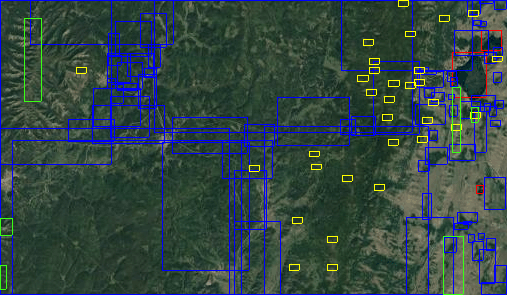

In [285]:
Image(filename='images/8.png')

In [286]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=51.6480,
                                       right_top_lon=59.6781,
                                       result_img_address="images/9.png",
                                       json_filename="jsons/9.json")

51.4081 58.9805
440 46
159 554
(281, 508, 3)
{'type': 'node', 'id': 4237257926, 'lat': 51.6383667, 'lon': 59.1618333, 'tags': {'ele': '325', 'name': 'Незнайка', 'natural': 'peak'}}
51.648 59.6781 51.4081 58.9805
Counter({'water': 12, 'peak': 1})
0 water
{'maxlat': 51.6053787, 'minlat': 51.5988758, 'maxlon': 59.2394988, 'minlon': 59.2277209}
50 58 189 180
Going to show

1 water
{'maxlat': 51.6467294, 'minlat': 51.6323765, 'maxlon': 59.2931464, 'minlon': 59.2754086}
1 18 228 215
Going to show

2 water
{'maxlat': 51.6246152, 'minlat': 51.6178157, 'maxlon': 59.575005, 'minlon': 59.5633312}
27 35 433 424
Going to show

3 water
{'maxlat': 51.5873875, 'minlat': 51.584574, 'maxlon': 59.5116064, 'minlon': 59.5067657}
71 74 387 383
4 water
{'maxlat': 51.4269202, 'minlat': 51.4206042, 'maxlon': 59.6192172, 'minlon': 59.6061045}
259 266 465 456
Going to show

5 water
{'maxlat': 51.4349979, 'minlat': 51.4188097, 'maxlon': 59.1390435, 'minlon': 59.1160811}
249 268 115 99
Going to show

6 water
{'max

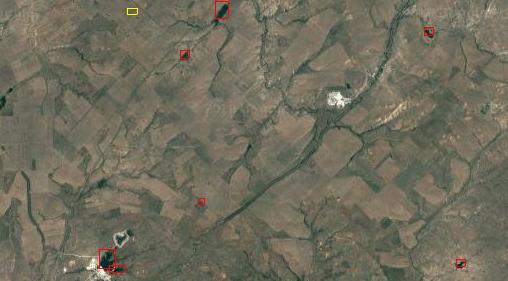

In [287]:
Image(filename='images/9.png')

In [288]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=51.6480,
                                       right_top_lon=38.6781,
                                       result_img_address="images/10.png",
                                       json_filename="jsons/10.json")

51.4081 37.9805
440 45
159 553
(281, 508, 3)
51.648 38.6781 51.4081 37.9805
Counter({'wood': 1195, 'water': 97, 'valley': 80})
0 water
{'maxlat': 51.5723927, 'minlat': 51.5587686, 'maxlon': 38.3754954, 'minlon': 38.3628117}
89 105 288 278
Going to show

1 water
{'maxlat': 51.55719, 'minlat': 51.5548618, 'maxlon': 38.3708188, 'minlon': 38.369906}
106 109 284 284
2 water
{'maxlat': 51.5478429, 'minlat': 51.5453609, 'maxlon': 38.392956, 'minlon': 38.3899519}
117 120 300 298
3 water
{'maxlat': 51.5431277, 'minlat': 51.541633, 'maxlon': 38.3779923, 'minlon': 38.3758037}
123 125 289 288
4 water
{'maxlat': 51.4827369, 'minlat': 51.4795562, 'maxlon': 38.3653927, 'minlon': 38.3621697}
194 197 280 278
5 water
{'maxlat': 51.4953321, 'minlat': 51.4911798, 'maxlon': 38.3887998, 'minlon': 38.3857519}
179 184 297 295
6 water
{'maxlat': 51.648, 'minlat': 51.6471714, 'maxlon': 38.6473286, 'minlon': 38.6397959}
0 1 486 480
7 water
{'maxlat': 51.4083988, 'minlat': 51.4081, 'maxlon': 38.6705704, 'minlon':

9 66 388 360
Going to show

280 wood
{'maxlat': 51.5916521, 'minlat': 51.5854857, 'maxlon': 38.5040852, 'minlon': 38.4920386}
66 73 381 373
Going to show

281 wood
{'maxlat': 51.6403483, 'minlat': 51.5915795, 'maxlon': 38.5138616, 'minlon': 38.4745211}
9 66 388 360
Going to show

282 wood
{'maxlat': 51.6403483, 'minlat': 51.5915795, 'maxlon': 38.5138616, 'minlon': 38.4745211}
9 66 388 360
Going to show

283 wood
{'maxlat': 51.5926001, 'minlat': 51.5907516, 'maxlon': 38.5022751, 'minlon': 38.5002933}
65 67 380 379
284 wood
{'maxlat': 51.6403483, 'minlat': 51.5915795, 'maxlon': 38.5138616, 'minlon': 38.4745211}
9 66 388 360
Going to show

285 wood
{'maxlat': 51.6470998, 'minlat': 51.6366283, 'maxlon': 38.5385107, 'minlon': 38.4951508}
1 13 406 375
Going to show

286 wood
{'maxlat': 51.6384296, 'minlat': 51.6362356, 'maxlon': 38.5155953, 'minlon': 38.5138278}
11 14 390 388
287 wood
{'maxlat': 51.6470998, 'minlat': 51.6366283, 'maxlon': 38.5385107, 'minlon': 38.4951508}
1 13 406 375
Going 

166 169 236 228
Going to show

506 wood
{'maxlat': 51.565265, 'minlat': 51.5643425, 'maxlon': 38.2816827, 'minlon': 38.2798193}
97 98 219 218
507 wood
{'maxlat': 51.5642378, 'minlat': 51.5631318, 'maxlon': 38.2793956, 'minlon': 38.2760903}
98 99 218 215
508 wood
{'maxlat': 51.5657945, 'minlat': 51.5613915, 'maxlon': 38.2763095, 'minlon': 38.2718743}
96 101 215 212
509 wood
{'maxlat': 51.5615455, 'minlat': 51.5525672, 'maxlon': 38.3170107, 'minlon': 38.2790704}
101 112 245 217
Going to show

510 wood
{'maxlat': 51.5851276, 'minlat': 51.5790952, 'maxlon': 38.2698561, 'minlon': 38.25759}
74 81 211 202
Going to show

511 wood
{'maxlat': 51.5874334, 'minlat': 51.5742388, 'maxlon': 38.3041437, 'minlon': 38.2832217}
71 86 236 220
Going to show

512 wood
{'maxlat': 51.5876951, 'minlat': 51.5812615, 'maxlon': 38.2748642, 'minlon': 38.2651534}
71 78 214 207
Going to show

513 wood
{'maxlat': 51.5824849, 'minlat': 51.5819843, 'maxlon': 38.2981882, 'minlon': 38.297053}
77 77 231 231
514 wood
{'max

{'maxlat': 51.5249416, 'minlat': 51.5238665, 'maxlon': 38.0732378, 'minlon': 38.0694408}
144 145 68 65
780 wood
{'maxlat': 51.5646243, 'minlat': 51.5519833, 'maxlon': 38.0564095, 'minlon': 38.0373814}
98 112 55 41
Going to show

781 wood
{'maxlat': 51.5772851, 'minlat': 51.5715841, 'maxlon': 38.0795052, 'minlon': 38.0657973}
83 90 72 62
Going to show

782 wood
{'maxlat': 51.551501, 'minlat': 51.5378527, 'maxlon': 38.0374467, 'minlon': 38.0300445}
113 129 41 36
783 wood
{'maxlat': 51.5587191, 'minlat': 51.5544759, 'maxlon': 38.0692853, 'minlon': 38.0589097}
105 110 65 57
Going to show

784 wood
{'maxlat': 51.5795618, 'minlat': 51.5780936, 'maxlon': 38.0853688, 'minlon': 38.0829051}
80 82 76 75
785 wood
{'maxlat': 51.5891356, 'minlat': 51.5858007, 'maxlon': 38.1023705, 'minlon': 38.0951933}
69 73 89 84
786 wood
{'maxlat': 51.5483819, 'minlat': 51.5454289, 'maxlon': 38.0489106, 'minlon': 38.0430743}
117 120 50 46
787 wood
{'maxlat': 51.5656467, 'minlat': 51.5514463, 'maxlon': 38.058221, '

265 266 87 86
1053 wood
{'maxlat': 51.4287573, 'minlat': 51.4280534, 'maxlon': 38.0892756, 'minlon': 38.0875798}
257 258 79 78
1054 wood
{'maxlat': 51.4334365, 'minlat': 51.4329384, 'maxlon': 38.0811879, 'minlon': 38.0804817}
251 252 73 73
1055 wood
{'maxlat': 51.4089087, 'minlat': 51.4081, 'maxlon': 38.1207369, 'minlon': 38.1184335}
280 280 102 100
1056 wood
{'maxlat': 51.4152173, 'minlat': 51.4143768, 'maxlon': 38.103931, 'minlon': 38.1023626}
273 274 90 89
1057 wood
{'maxlat': 51.4152012, 'minlat': 51.414574, 'maxlon': 38.0976865, 'minlon': 38.0968529}
273 273 85 85
1058 wood
{'maxlat': 51.4118424, 'minlat': 51.410572, 'maxlon': 38.1129396, 'minlon': 38.1118181}
277 278 96 96
1059 wood
{'maxlat': 51.4207314, 'minlat': 51.4187913, 'maxlon': 38.1298743, 'minlon': 38.1269039}
266 268 109 107
1060 wood
{'maxlat': 51.4335483, 'minlat': 51.4326973, 'maxlon': 38.0803632, 'minlon': 38.077292}
251 252 73 70
1061 wood
{'maxlat': 51.4305088, 'minlat': 51.4296957, 'maxlon': 38.0875798, 'minlon'

28 79 382 354
Going to show

1326 valley
{'maxlat': 51.6330684, 'minlat': 51.6237061, 'maxlon': 38.4967308, 'minlon': 38.4705723}
17 28 376 357
Going to show

1327 valley
{'maxlat': 51.6125229, 'minlat': 51.6099295, 'maxlon': 38.4709637, 'minlon': 38.4674981}
42 45 357 355
1328 valley
{'maxlat': 51.6100642, 'minlat': 51.5966571, 'maxlon': 38.4307994, 'minlon': 38.3909922}
44 60 328 299
Going to show

1329 valley
{'maxlat': 51.5660723, 'minlat': 51.558164, 'maxlon': 38.4733505, 'minlon': 38.436149}
96 105 359 332
Going to show

1330 valley
{'maxlat': 51.5740657, 'minlat': 51.5711646, 'maxlon': 38.4639004, 'minlon': 38.4358149}
87 90 352 332
Going to show

1331 valley
{'maxlat': 51.6073722, 'minlat': 51.6056329, 'maxlon': 38.4567692, 'minlon': 38.4495065}
48 50 347 342
1332 valley
{'maxlat': 51.5447036, 'minlat': 51.5439034, 'maxlon': 38.4740391, 'minlon': 38.4569599}
121 122 359 347
1333 valley
{'maxlat': 51.5948623, 'minlat': 51.5828218, 'maxlon': 38.4368601, 'minlon': 38.4317973}
62 7

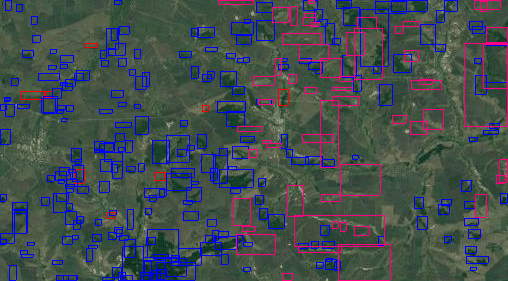

In [289]:
Image(filename='images/10.png')

In [290]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=50.6386,
                                       right_top_lon=38.6781,
                                       result_img_address="images/11.png",
                                       json_filename="jsons/11.json")

50.39869999999999 37.9805
436 45
161 553
(275, 508, 3)
50.6386 38.6781 50.39869999999999 37.9805
Counter({'wood': 122, 'water': 67})
0 water
{'maxlat': 50.4024217, 'minlat': 50.4001513, 'maxlon': 38.4076404, 'minlon': 38.4043359}
271 273 311 309
1 water
{'maxlat': 50.4275806, 'minlat': 50.4138816, 'maxlon': 38.420515, 'minlon': 38.411417}
242 258 320 314
Going to show

2 water
{'maxlat': 50.4681895, 'minlat': 50.4552673, 'maxlon': 38.4608125, 'minlon': 38.4449767}
195 210 350 338
Going to show

3 water
{'maxlat': 50.5794195, 'minlat': 50.573881, 'maxlon': 38.1270402, 'minlon': 38.1025252}
68 74 107 89
Going to show

4 water
{'maxlat': 50.5834941, 'minlat': 50.5774122, 'maxlon': 38.1739376, 'minlon': 38.1429694}
63 70 141 118
Going to show

5 water
{'maxlat': 50.4340673, 'minlat': 50.4232409, 'maxlon': 38.6344301, 'minlon': 38.6192914}
234 247 476 465
Going to show

6 water
{'maxlat': 50.4257034, 'minlat': 50.4223677, 'maxlon': 38.070755, 'minlon': 38.0637598}
244 248 66 61
7 water
{'ma

Wall time: 2.57 s


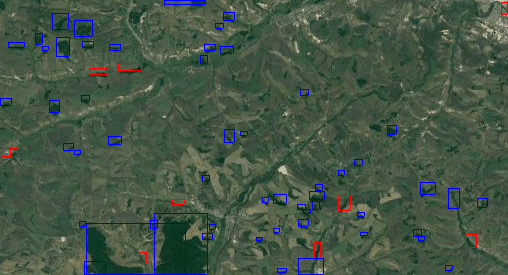

In [291]:
Image(filename='images/11.png')

In [292]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=51.6480,
                                       right_top_lon=39.6081,
                                       result_img_address="images/12.png",
                                       json_filename="jsons/12.json")

51.4081 38.9105
440 45
159 553
(281, 508, 3)
51.648 39.6081 51.4081 38.9105
Counter({'wood': 1912, 'water': 176, 'valley': 25})
0 water
{'maxlat': 51.6434674, 'minlat': 51.6391709, 'maxlon': 38.9908937, 'minlon': 38.9832347}
5 10 59 53
Going to show

1 water
{'maxlat': 51.6282553, 'minlat': 51.6252982, 'maxlon': 38.964663, 'minlon': 38.9619164}
23 27 39 37
2 water
{'maxlat': 51.6256033, 'minlat': 51.6233732, 'maxlon': 38.9732835, 'minlon': 38.9706847}
26 29 46 44
3 water
{'maxlat': 51.6220358, 'minlat': 51.6213073, 'maxlon': 38.9600362, 'minlon': 38.9586869}
30 31 36 35
4 water
{'maxlat': 51.648, 'minlat': 51.5298758, 'maxlon': 39.2894347, 'minlon': 39.1350514}
0 138 276 164
Going to show

5 water
{'maxlat': 51.648, 'minlat': 51.5298758, 'maxlon': 39.2894347, 'minlon': 39.1350514}
0 138 276 164
Going to show

6 water
{'maxlat': 51.648, 'minlat': 51.5298758, 'maxlon': 39.2894347, 'minlon': 39.1350514}
0 138 276 164
Going to show

7 water
{'maxlat': 51.648, 'minlat': 51.5298758, 'maxlon'

277 wood
{'maxlat': 51.6397259, 'minlat': 51.6362555, 'maxlon': 39.3294295, 'minlon': 39.3221723}
10 14 305 300
278 wood
{'maxlat': 51.6311557, 'minlat': 51.6285185, 'maxlon': 39.3473207, 'minlon': 39.3415593}
20 23 318 314
279 wood
{'maxlat': 51.6340659, 'minlat': 51.6312423, 'maxlon': 39.3416344, 'minlon': 39.3362056}
16 20 314 310
280 wood
{'maxlat': 51.6344122, 'minlat': 51.632481, 'maxlon': 39.3375146, 'minlon': 39.3334161}
16 18 311 308
281 wood
{'maxlat': 51.6346919, 'minlat': 51.633986, 'maxlon': 39.3360983, 'minlon': 39.3345319}
16 16 310 309
282 wood
{'maxlat': 51.6352645, 'minlat': 51.6346186, 'maxlon': 39.3344354, 'minlon': 39.3334269}
15 16 309 308
283 wood
{'maxlat': 51.6283253, 'minlat': 51.6242226, 'maxlon': 39.3559467, 'minlon': 39.3479644}
23 28 324 319
284 wood
{'maxlat': 51.6298371, 'minlat': 51.6291445, 'maxlon': 39.3444561, 'minlon': 39.3431043}
21 22 316 315
285 wood
{'maxlat': 51.628998, 'minlat': 51.6282787, 'maxlon': 39.3463444, 'minlon': 39.3448423}
22 23 317

496 wood
{'maxlat': 51.585141, 'minlat': 51.5846759, 'maxlon': 38.9625113, 'minlon': 38.9599867}
74 74 38 36
497 wood
{'maxlat': 51.589822, 'minlat': 51.5886162, 'maxlon': 38.9656966, 'minlon': 38.9581961}
68 70 40 35
498 wood
{'maxlat': 51.5885577, 'minlat': 51.5848911, 'maxlon': 38.9657359, 'minlon': 38.9620304}
70 74 40 38
499 wood
{'maxlat': 51.5835279, 'minlat': 51.583201, 'maxlon': 38.9757548, 'minlon': 38.9734633}
76 76 48 46
500 wood
{'maxlat': 51.5848453, 'minlat': 51.5840028, 'maxlon': 38.9675781, 'minlon': 38.9624795}
74 75 42 38
501 wood
{'maxlat': 51.5612803, 'minlat': 51.5608174, 'maxlon': 38.9725603, 'minlon': 38.9694922}
102 102 45 43
502 wood
{'maxlat': 51.5806874, 'minlat': 51.5797887, 'maxlon': 38.9829555, 'minlon': 38.980402}
79 80 53 51
503 wood
{'maxlat': 51.5787343, 'minlat': 51.5784078, 'maxlon': 38.9783578, 'minlon': 38.97568}
81 82 49 47
504 wood
{'maxlat': 51.5606058, 'minlat': 51.5602697, 'maxlon': 38.9673822, 'minlon': 38.9663842}
102 103 41 41
505 wood
{'m

0 4 44 30
Going to show

770 wood
{'maxlat': 51.6444849, 'minlat': 51.6419558, 'maxlon': 38.9512534, 'minlon': 38.9463534}
4 7 30 26
771 wood
{'maxlat': 51.6453853, 'minlat': 51.6446996, 'maxlon': 38.966584, 'minlon': 38.9652924}
3 4 41 40
772 wood
{'maxlat': 51.419074, 'minlat': 51.4152307, 'maxlon': 39.2450347, 'minlon': 39.2418709}
268 273 244 241
773 wood
{'maxlat': 51.4156186, 'minlat': 51.4092019, 'maxlon': 39.2475618, 'minlon': 39.2428042}
272 280 245 242
774 wood
{'maxlat': 51.4153388, 'minlat': 51.4099077, 'maxlon': 39.2487686, 'minlon': 39.2444885}
273 279 246 243
775 wood
{'maxlat': 51.4093089, 'minlat': 51.4081, 'maxlon': 39.2680178, 'minlon': 39.2483569}
280 280 260 246
776 wood
{'maxlat': 51.4087652, 'minlat': 51.4081, 'maxlon': 39.2644673, 'minlon': 39.2472538}
280 280 258 245
777 wood
{'maxlat': 51.6417715, 'minlat': 51.640191, 'maxlon': 39.0146159, 'minlon': 39.0112364}
7 9 76 73
778 wood
{'maxlat': 51.4491053, 'minlat': 51.4476302, 'maxlon': 39.0344935, 'minlon': 39.0

1041 wood
{'maxlat': 51.5441696, 'minlat': 51.5397441, 'maxlon': 39.136466, 'minlon': 39.1274916}
122 127 165 158
Going to show

1042 wood
{'maxlat': 51.5424181, 'minlat': 51.5417292, 'maxlon': 39.1282144, 'minlon': 39.1270316}
124 124 159 158
1043 wood
{'maxlat': 51.5414777, 'minlat': 51.5387044, 'maxlon': 39.1265688, 'minlon': 39.1221473}
125 128 157 154
1044 wood
{'maxlat': 51.545512, 'minlat': 51.5448114, 'maxlon': 39.1293289, 'minlon': 39.1281367}
120 121 159 158
1045 wood
{'maxlat': 51.5473834, 'minlat': 51.5458808, 'maxlon': 39.1199159, 'minlon': 39.1189467}
118 120 152 152
1046 wood
{'maxlat': 51.5468948, 'minlat': 51.5461008, 'maxlon': 39.1342024, 'minlon': 39.132907}
118 119 163 162
1047 wood
{'maxlat': 51.5513349, 'minlat': 51.5506848, 'maxlon': 39.1367601, 'minlon': 39.1352367}
113 114 165 164
1048 wood
{'maxlat': 51.5467573, 'minlat': 51.5444087, 'maxlon': 39.1218768, 'minlon': 39.118044}
119 121 154 151
1049 wood
{'maxlat': 51.544239, 'minlat': 51.5430955, 'maxlon': 39.13

267 280 150 124
Going to show

1310 wood
{'maxlat': 51.4320101, 'minlat': 51.4090302, 'maxlon': 39.1669447, 'minlon': 39.1142072}
253 280 187 148
Going to show

1311 wood
{'maxlat': 51.4136223, 'minlat': 51.4081, 'maxlon': 39.1383091, 'minlon': 39.1196321}
275 280 166 152
Going to show

1312 wood
{'maxlat': 51.4288047, 'minlat': 51.419519, 'maxlon': 39.1695351, 'minlon': 39.1536028}
257 268 189 177
Going to show

1313 wood
{'maxlat': 51.4221015, 'minlat': 51.4161602, 'maxlon': 39.1556842, 'minlon': 39.1435284}
265 272 179 170
Going to show

1314 wood
{'maxlat': 51.4213388, 'minlat': 51.4165148, 'maxlon': 39.1222531, 'minlon': 39.1141743}
265 271 154 148
Going to show

1315 wood
{'maxlat': 51.4272744, 'minlat': 51.4239122, 'maxlon': 39.1317257, 'minlon': 39.1257397}
259 262 161 157
1316 wood
{'maxlat': 51.636254, 'minlat': 51.6293552, 'maxlon': 39.3021657, 'minlon': 39.2938318}
14 22 285 279
Going to show

1317 wood
{'maxlat': 51.6407887, 'minlat': 51.6388933, 'maxlon': 39.3015664, 'min

82 85 453 451
1588 wood
{'maxlat': 51.5360773, 'minlat': 51.534965, 'maxlon': 39.4716505, 'minlon': 39.4696863}
131 132 409 407
1589 wood
{'maxlat': 51.5480368, 'minlat': 51.5404183, 'maxlon': 39.4076505, 'minlon': 39.4064457}
117 126 362 361
1590 wood
{'maxlat': 51.5155855, 'minlat': 51.5152124, 'maxlon': 39.4633548, 'minlon': 39.4448094}
155 156 403 389
1591 wood
{'maxlat': 51.5246649, 'minlat': 51.5243947, 'maxlon': 39.5100799, 'minlon': 39.4952264}
144 145 437 426
1592 wood
{'maxlat': 51.5152886, 'minlat': 51.5149853, 'maxlon': 39.4794482, 'minlon': 39.4696755}
155 156 414 407
1593 wood
{'maxlat': 51.5219699, 'minlat': 51.521647, 'maxlon': 39.4271232, 'minlon': 39.4150052}
148 148 376 367
1594 wood
{'maxlat': 51.5213585, 'minlat': 51.5207756, 'maxlon': 39.5589967, 'minlon': 39.5493352}
148 149 472 465
1595 wood
{'maxlat': 51.5376377, 'minlat': 51.537134, 'maxlon': 39.5571074, 'minlon': 39.5455005}
129 130 471 462
1596 wood
{'maxlat': 51.5502241, 'minlat': 51.5384858, 'maxlon': 39.5

1861 wood
{'maxlat': 51.597027, 'minlat': 51.572728, 'maxlon': 39.096398, 'minlon': 39.0568096}
60 88 135 107
Going to show

1862 wood
{'maxlat': 51.5803691, 'minlat': 51.5710994, 'maxlon': 39.1026646, 'minlon': 39.0894655}
79 90 140 130
Going to show

1863 wood
{'maxlat': 51.5872725, 'minlat': 51.583786, 'maxlon': 39.0600006, 'minlon': 39.0539066}
71 75 109 104
1864 wood
{'maxlat': 51.5978083, 'minlat': 51.5918731, 'maxlon': 39.0674189, 'minlon': 39.0624836}
59 66 114 111
1865 wood
{'maxlat': 51.5993811, 'minlat': 51.5919831, 'maxlon': 39.0691516, 'minlon': 39.0627948}
57 66 116 111
1866 wood
{'maxlat': 51.6035412, 'minlat': 51.5913851, 'maxlon': 39.1031876, 'minlon': 39.0850452}
52 66 140 127
Going to show

1867 wood
{'maxlat': 51.6156583, 'minlat': 51.5785864, 'maxlon': 39.146508, 'minlon': 39.0966671}
38 81 172 136
Going to show

1868 wood
{'maxlat': 51.5679864, 'minlat': 51.5663492, 'maxlon': 39.0667732, 'minlon': 39.0650532}
94 96 114 113
1869 wood
{'maxlat': 51.5745998, 'minlat'

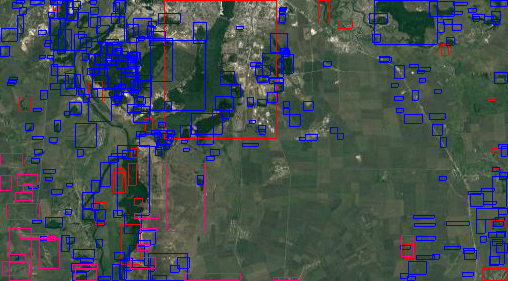

In [293]:
Image(filename='images/12.png')

In [294]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=53.6480,
                                       right_top_lon=59.6781,
                                       result_img_address="images/13.png",
                                       json_filename="jsons/13.json")

53.4081 58.9805
446 46
152 554
(294, 508, 3)
{'type': 'node', 'id': 3687677030, 'lat': 53.4291551, 'lon': 59.1130107, 'tags': {'ele': '616', 'name': 'Магнитная', 'natural': 'peak'}}
{'type': 'node', 'id': 4082625591, 'lat': 53.4701167, 'lon': 59.5632333, 'tags': {'ele': '417.7', 'name': 'Алданайская', 'natural': 'peak'}}
{'type': 'node', 'id': 4082625598, 'lat': 53.5044056, 'lon': 59.3295389, 'tags': {'ele': '525.1', 'name': 'Бажанкина', 'natural': 'peak'}}
{'type': 'node', 'id': 4082625606, 'lat': 53.4781528, 'lon': 59.1225, 'tags': {'ele': '459.8', 'name': 'Берёзовая', 'natural': 'peak'}}
{'type': 'node', 'id': 4082625608, 'lat': 53.4442556, 'lon': 59.2754639, 'tags': {'ele': '429', 'name': 'Большая', 'natural': 'peak'}}
{'type': 'node', 'id': 4082625615, 'lat': 53.5688333, 'lon': 59.3083389, 'tags': {'ele': '487.2', 'name': 'Вышка', 'natural': 'peak'}}
{'type': 'node', 'id': 4082625616, 'lat': 53.6191389, 'lon': 59.4144889, 'tags': {'ele': '437.1', 'name': 'Голый Камень', 'natural':

77 103 486 459
Going to show

176 wood
{'maxlat': 53.6145629, 'minlat': 53.614011, 'maxlon': 59.6025609, 'minlon': 59.6018193}
41 42 453 452
177 wood
{'maxlat': 53.6049602, 'minlat': 53.6033389, 'maxlon': 59.6663386, 'minlon': 59.6595417}
53 55 499 494
178 wood
{'maxlat': 53.6094798, 'minlat': 53.6065497, 'maxlon': 59.5314928, 'minlon': 59.5256716}
47 51 401 397
179 wood
{'maxlat': 53.6155253, 'minlat': 53.6110127, 'maxlon': 59.4941881, 'minlon': 59.4864535}
40 45 374 368
Going to show

180 wood
{'maxlat': 53.6286519, 'minlat': 53.6264205, 'maxlon': 59.6117295, 'minlon': 59.6074081}
24 26 460 457
181 wood
{'maxlat': 53.5850806, 'minlat': 53.5638699, 'maxlon': 59.6483489, 'minlon': 59.61067}
77 103 486 459
Going to show

182 wood
{'maxlat': 53.648, 'minlat': 53.6305266, 'maxlon': 59.5345069, 'minlon': 59.4966536}
0 21 403 376
Going to show

183 wood
{'maxlat': 53.6067577, 'minlat': 53.6061308, 'maxlon': 59.6327273, 'minlon': 59.6310573}
51 51 475 474
184 wood
{'maxlat': 53.6079464, 'min

265 271 102 91
Going to show

413 peak
{'maxlat': 53.472515699999995, 'minlat': 53.4677177, 'maxlon': 59.5702093, 'minlon': 59.5562573}
215 221 429 419
Going to show

414 peak
{'maxlat': 53.506804599999995, 'minlat': 53.5020066, 'maxlon': 59.336514900000005, 'minlon': 59.3225629}
173 179 259 249
Going to show

415 peak
{'maxlat': 53.48055179999999, 'minlat': 53.4757538, 'maxlon': 59.129476000000004, 'minlon': 59.115524}
205 211 108 98
Going to show

416 peak
{'maxlat': 53.446654599999995, 'minlat': 53.4418566, 'maxlon': 59.2824399, 'minlon': 59.2684879}
247 253 220 210
Going to show

417 peak
{'maxlat': 53.5712323, 'minlat': 53.566434300000004, 'maxlon': 59.315314900000004, 'minlon': 59.3013629}
94 100 244 234
Going to show

418 peak
{'maxlat': 53.6215379, 'minlat': 53.616739900000006, 'maxlon': 59.421464900000004, 'minlon': 59.4075129}
32 38 321 311
Going to show

419 peak
{'maxlat': 53.53581569999999, 'minlat': 53.5310177, 'maxlon': 59.1816843, 'minlon': 59.1677323}
137 143 147 136
G

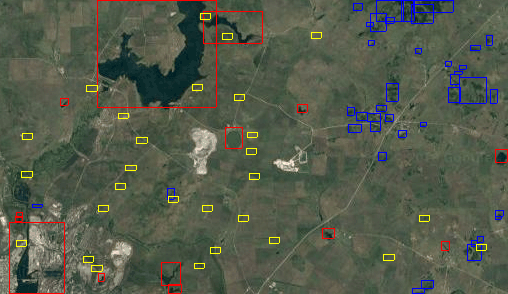

In [295]:
Image(filename='images/13.png')

In [296]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=33.6480,
                                       right_top_lon=39.6781,
                                       result_img_address="images/14.png",
                                       json_filename="jsons/14.json")

33.4081 38.9805
403 45
194 553
(209, 508, 3)
{'type': 'node', 'id': 2488075973, 'lat': 33.46635, 'lon': 39.155639, 'tags': {'alt_name': 'خبرة الصلبية', 'int_name': 'Khabrat aş Şalbīyah, خبرة الصلبية, Khabrat as Salbiyah, خبرة الصلبية', 'is_in': 'Iraq , جمهورية العراق', 'name': 'خبرة الصلبية', 'name:ar': 'خبرة الصلبية', 'name:ar1': 'خبرة الصلبية', 'name:de': 'Khabrat as Salbiyah', 'name:en': 'Khabrat as Salbiyah', 'name:fr': 'Khabrat as Salbiyah', 'natural': 'water'}}
{'type': 'node', 'id': 2488075987, 'lat': 33.471333, 'lon': 39.14055, 'tags': {'alt_name': 'خبرة السالوبية', 'int_name': 'Khabrat as Sālūbīyah, خبرة السالوبية, Khabrat as Salubiyah, خبرة السالوبية', 'is_in': 'Iraq , جمهورية العراق', 'name': 'خبرة السالوبية', 'name:ar': 'خبرة السالوبية', 'name:ar1': 'خبرة السالوبية', 'name:de': 'Khabrat as Salubiyah', 'name:en': 'Khabrat as Salubiyah', 'name:fr': 'Khabrat as Salubiyah', 'natural': 'water'}}
{'type': 'node', 'id': 567055310, 'lat': 33.6333333, 'lon': 39.2305556, 'tags': {'al

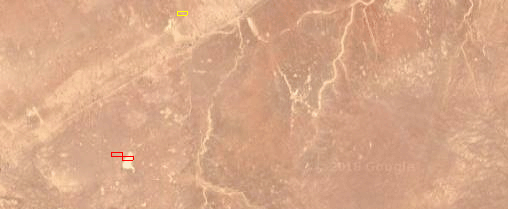

In [297]:
Image(filename='images/14.png')

In [298]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=51.6480,
                                       right_top_lon=49.6781,
                                       result_img_address="images/15.png",
                                       json_filename="jsons/15.json")

51.4081 48.9805
440 45
159 553
(281, 508, 3)
51.648 49.6781 51.4081 48.9805
Counter({'water': 12})
0 water
{'maxlat': 51.4096548, 'minlat': 51.4081, 'maxlon': 49.2578323, 'minlon': 49.200876}
279 280 202 160
1 water
{'maxlat': 51.4258319, 'minlat': 51.4139466, 'maxlon': 49.2271498, 'minlon': 49.2227181}
260 274 180 176
2 water
{'maxlat': 51.4272524, 'minlat': 51.4185138, 'maxlon': 49.2187808, 'minlon': 49.2006407}
259 269 174 160
Going to show

3 water
{'maxlat': 51.4514637, 'minlat': 51.4258388, 'maxlon': 49.2299946, 'minlon': 49.2171515}
230 260 182 172
Going to show

4 water
{'maxlat': 51.4536833, 'minlat': 51.4410537, 'maxlon': 49.0892741, 'minlon': 49.0666806}
228 242 79 63
Going to show

5 water
{'maxlat': 51.488394, 'minlat': 51.4662791, 'maxlon': 48.9839611, 'minlon': 48.9805}
187 213 3 0
6 water
{'maxlat': 51.5042614, 'minlat': 51.4995439, 'maxlon': 48.9855075, 'minlon': 48.9839825}
168 174 4 3
7 water
{'maxlat': 51.5151473, 'minlat': 51.5116201, 'maxlon': 48.9822875, 'minlon'

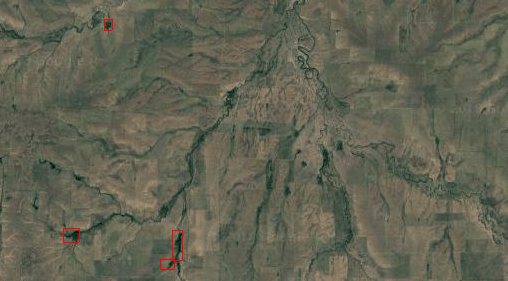

In [299]:
Image(filename='images/15.png')

In [300]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=59.6480,
                                       right_top_lon=49.6781,
                                       result_img_address="images/16.png",
                                       json_filename="jsons/16.json")

59.4081 48.9805
471 45
126 553
(345, 508, 3)
59.648 49.6781 59.4081 48.9805
Counter({'wood': 13, 'water': 2})
0 water
{'maxlat': 59.4547984, 'minlat': 59.4531082, 'maxlon': 49.2465963, 'minlon': 49.2405181}
278 280 194 189
1 water
{'maxlat': 59.492061, 'minlat': 59.4887027, 'maxlon': 49.5513166, 'minlon': 49.542781}
224 229 416 409
Going to show

2 wood
{'maxlat': 59.4195012, 'minlat': 59.4081, 'maxlon': 49.0135017, 'minlon': 48.9982182}
329 344 24 13
Going to show

3 wood
{'maxlat': 59.4221732, 'minlat': 59.4081, 'maxlon': 49.0409897, 'minlon': 49.0076387}
325 344 44 20
Going to show

4 wood
{'maxlat': 59.4103152, 'minlat': 59.4087737, 'maxlon': 48.9839129, 'minlon': 48.9805}
342 344 2 0
5 wood
{'maxlat': 59.4251179, 'minlat': 59.4170717, 'maxlon': 49.0185987, 'minlon': 48.993795}
321 332 28 10
Going to show

6 wood
{'maxlat': 59.4217726, 'minlat': 59.4128818, 'maxlon': 48.9974954, 'minlon': 48.9913387}
325 338 12 8
7 wood
{'maxlat': 59.4441283, 'minlat': 59.4340894, 'maxlon': 48.9952

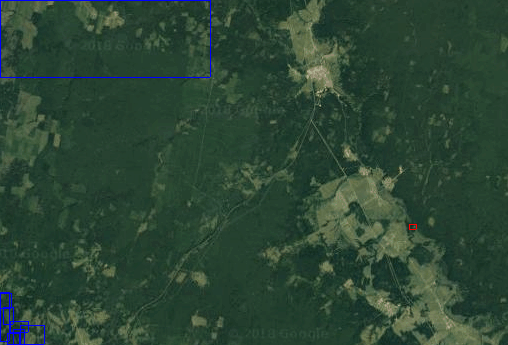

In [301]:
Image(filename='images/16.png')

In [302]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=51.6480,
                                       right_top_lon=45.6781,
                                       result_img_address="images/17.png",
                                       json_filename="jsons/17.json")

51.4081 44.9805
440 45
159 553
(281, 508, 3)
51.648 45.6781 51.4081 44.9805
Counter({'wood': 308, 'water': 45})
0 water
{'maxlat': 51.5187565, 'minlat': 51.5155672, 'maxlon': 45.5563652, 'minlon': 45.552767}
151 155 419 417
1 water
{'maxlat': 51.5052974, 'minlat': 51.5030668, 'maxlon': 45.4933974, 'minlon': 45.4863174}
167 170 373 368
2 water
{'maxlat': 51.5028646, 'minlat': 51.4938363, 'maxlon': 45.4243987, 'minlon': 45.4181931}
170 181 323 319
3 water
{'maxlat': 51.4740294, 'minlat': 51.473194, 'maxlon': 45.5076083, 'minlon': 45.5033543}
204 205 384 381
4 water
{'maxlat': 51.4868593, 'minlat': 51.4842626, 'maxlon': 45.5538278, 'minlon': 45.5506145}
189 192 418 415
5 water
{'maxlat': 51.4856189, 'minlat': 51.4846736, 'maxlon': 45.5912983, 'minlon': 45.5900412}
190 191 445 444
6 water
{'maxlat': 51.5150391, 'minlat': 51.514131, 'maxlon': 45.6324737, 'minlon': 45.6304374}
156 157 475 473
7 water
{'maxlat': 51.5165867, 'minlat': 51.5159378, 'maxlon': 45.6352762, 'minlon': 45.6340163}
154

178 203 186 168
Going to show

186 wood
{'maxlat': 51.4885682, 'minlat': 51.4859231, 'maxlon': 45.2391617, 'minlon': 45.2332747}
187 190 188 184
187 wood
{'maxlat': 51.4876759, 'minlat': 51.4868559, 'maxlon': 45.270454, 'minlon': 45.268827}
188 189 211 210
188 wood
{'maxlat': 51.4876593, 'minlat': 51.4868359, 'maxlon': 45.2686834, 'minlon': 45.2668986}
188 189 210 209
189 wood
{'maxlat': 51.4869118, 'minlat': 51.4801116, 'maxlon': 45.2175564, 'minlon': 45.2110691}
189 197 173 168
190 wood
{'maxlat': 51.4747088, 'minlat': 51.4081, 'maxlon': 45.3662343, 'minlon': 45.2741325}
203 280 281 214
Going to show

191 wood
{'maxlat': 51.4792347, 'minlat': 51.4117419, 'maxlon': 45.2757065, 'minlon': 45.2096629}
198 277 215 167
Going to show

192 wood
{'maxlat': 51.4747088, 'minlat': 51.4081, 'maxlon': 45.3662343, 'minlon': 45.2741325}
203 280 281 214
Going to show

193 wood
{'maxlat': 51.4747088, 'minlat': 51.4081, 'maxlon': 45.3662343, 'minlon': 45.2741325}
203 280 281 214
Going to show

194 wood

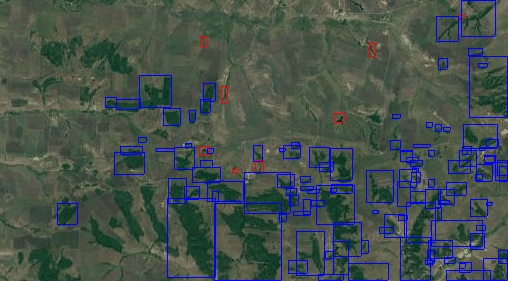

In [303]:
Image(filename='images/17.png')

In [304]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=39.6581,
                                       right_top_lon=45.2431,
                                       result_img_address="images/18.png",
                                       json_filename="jsons/18.json")

39.41819999999999 44.5455
412 46
185 554
(227, 508, 3)
{'type': 'node', 'id': 2467931192, 'lat': 39.6497153, 'lon': 45.2342859, 'tags': {'ele': '2509', 'name': 'Գնիշիկ', 'name:en': 'Gnishik', 'natural': 'peak'}}
{'type': 'node', 'id': 3141778680, 'lat': 39.6289828, 'lon': 44.8420023, 'tags': {'name': 'Дагна', 'natural': 'peak'}}
{'type': 'node', 'id': 4745861555, 'lat': 39.5923509, 'lon': 45.1673879, 'tags': {'ele': '1997', 'natural': 'peak'}}
{'type': 'node', 'id': 4745861561, 'lat': 39.5840502, 'lon': 45.2270915, 'tags': {'ele': '2073', 'natural': 'peak'}}
{'type': 'node', 'id': 4745861562, 'lat': 39.603087, 'lon': 45.203555, 'tags': {'ele': '1975', 'natural': 'peak'}}
{'type': 'node', 'id': 4745861563, 'lat': 39.6077335, 'lon': 45.2325448, 'tags': {'ele': '2338', 'name': 'Ավշասար', 'name:en': 'Avshasar', 'natural': 'peak'}}
{'type': 'node', 'id': 4745861631, 'lat': 39.6492582, 'lon': 45.1862701, 'tags': {'ele': '1915', 'name': 'Բերդաքար', 'name:en': 'Berdaqar', 'name:ru': 'Бердакар'

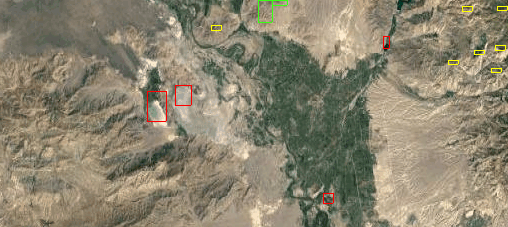

In [305]:
Image(filename='images/18.png')

In [306]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=48.6581,
                                       right_top_lon=33.2431,
                                       result_img_address="images/19.png",
                                       json_filename="jsons/19.json")

48.41819999999999 32.5455
431 45
166 552
(265, 507, 3)
48.6581 33.2431 48.41819999999999 32.5455
Counter({'wood': 522, 'water': 159})
0 water
{'maxlat': 48.6581, 'minlat': 48.6547073, 'maxlon': 33.0856148, 'minlon': 33.0662616}
0 4 393 378
Going to show

1 water
{'maxlat': 48.6557846, 'minlat': 48.6535811, 'maxlon': 33.0897695, 'minlon': 33.0865176}
3 5 396 393
2 water
{'maxlat': 48.6523957, 'minlat': 48.6452092, 'maxlon': 33.0548134, 'minlon': 33.0464889}
6 14 370 364
Going to show

3 water
{'maxlat': 48.5016669, 'minlat': 48.499918, 'maxlon': 33.1689855, 'minlon': 33.1659332}
173 175 453 451
4 water
{'maxlat': 48.6249893, 'minlat': 48.6239783, 'maxlon': 32.5470569, 'minlon': 32.5455}
37 38 1 0
5 water
{'maxlat': 48.6324671, 'minlat': 48.6276204, 'maxlon': 33.1325123, 'minlon': 33.1277132}
28 34 427 423
6 water
{'maxlat': 48.6173997, 'minlat': 48.613611, 'maxlon': 33.0162752, 'minlon': 33.0087983}
45 49 342 337
7 water
{'maxlat': 48.6281673, 'minlat': 48.6262751, 'maxlon': 33.0429348,

139 water
{'maxlat': 48.6404134, 'minlat': 48.636457, 'maxlon': 32.9119252, 'minlon': 32.9097998}
20 24 266 265
140 water
{'maxlat': 48.633768, 'minlat': 48.6323907, 'maxlon': 32.9181902, 'minlon': 32.9156634}
27 28 271 269
141 water
{'maxlat': 48.630765, 'minlat': 48.6282872, 'maxlon': 32.9247703, 'minlon': 32.9214339}
30 33 276 273
142 water
{'maxlat': 48.6321963, 'minlat': 48.6311295, 'maxlon': 32.9204219, 'minlon': 32.9186767}
29 30 272 271
143 water
{'maxlat': 48.6581, 'minlat': 48.656117, 'maxlon': 32.8264414, 'minlon': 32.8244338}
0 2 204 203
144 water
{'maxlat': 48.5173462, 'minlat': 48.5157817, 'maxlon': 32.9381707, 'minlon': 32.9350672}
155 157 285 283
145 water
{'maxlat': 48.5796765, 'minlat': 48.5777433, 'maxlon': 32.7195354, 'minlon': 32.7183216}
87 89 126 126
146 water
{'maxlat': 48.581073, 'minlat': 48.5793339, 'maxlon': 32.716256, 'minlon': 32.7122227}
85 87 124 121
147 water
{'maxlat': 48.6225502, 'minlat': 48.6199687, 'maxlon': 33.0440701, 'minlon': 33.028406}
39 42 3

259 264 429 423
Going to show

346 wood
{'maxlat': 48.4577756, 'minlat': 48.4557794, 'maxlon': 33.1566699, 'minlon': 33.15595}
221 223 444 444
347 wood
{'maxlat': 48.4203566, 'minlat': 48.4198646, 'maxlon': 33.1413006, 'minlon': 33.135192}
263 263 433 429
348 wood
{'maxlat': 48.4350381, 'minlat': 48.41819999999999, 'maxlon': 33.1880162, 'minlon': 33.1718548}
246 264 467 455
Going to show

349 wood
{'maxlat': 48.4224738, 'minlat': 48.4202545, 'maxlon': 33.1427479, 'minlon': 33.1410373}
260 263 434 433
350 wood
{'maxlat': 48.4719187, 'minlat': 48.4711531, 'maxlon': 33.2137573, 'minlon': 33.2070179}
206 207 486 481
351 wood
{'maxlat': 48.4896581, 'minlat': 48.4874071, 'maxlon': 33.1944291, 'minlon': 33.1922737}
186 189 472 470
352 wood
{'maxlat': 48.4903728, 'minlat': 48.4890889, 'maxlon': 33.1971359, 'minlon': 33.1894591}
185 187 474 468
353 wood
{'maxlat': 48.4856867, 'minlat': 48.480627, 'maxlon': 33.2063839, 'minlon': 33.2025239}
190 196 480 478
354 wood
{'maxlat': 48.4276959, 'minlat

115 116 19 17
620 wood
{'maxlat': 48.5535191, 'minlat': 48.5525281, 'maxlon': 32.5680281, 'minlon': 32.5641782}
116 117 16 14
621 wood
{'maxlat': 48.5633925, 'minlat': 48.5591437, 'maxlon': 32.5644525, 'minlon': 32.5455}
105 109 14 0
Going to show

622 wood
{'maxlat': 48.5575093, 'minlat': 48.5563896, 'maxlon': 32.5904252, 'minlon': 32.583916}
111 112 33 28
623 wood
{'maxlat': 48.5565243, 'minlat': 48.5559085, 'maxlon': 32.5838058, 'minlon': 32.5806795}
112 113 28 26
624 wood
{'maxlat': 48.577537, 'minlat': 48.5738594, 'maxlon': 32.5647938, 'minlon': 32.5455}
89 93 14 0
Going to show

625 wood
{'maxlat': 48.5694885, 'minlat': 48.5692197, 'maxlon': 32.5646953, 'minlon': 32.5562242}
98 98 14 8
626 wood
{'maxlat': 48.5687772, 'minlat': 48.5543673, 'maxlon': 32.5727421, 'minlon': 32.5714188}
99 115 20 19
627 wood
{'maxlat': 48.5560283, 'minlat': 48.5541492, 'maxlon': 32.5805805, 'minlon': 32.571783}
113 115 25 19
628 wood
{'maxlat': 48.5570137, 'minlat': 48.5561539, 'maxlon': 32.5887855, '

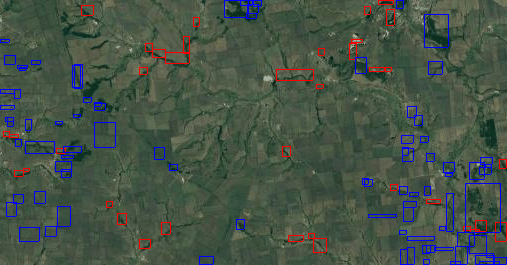

In [307]:
Image(filename='images/19.png')

In [308]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=48.6581,
                                       right_top_lon=23.2431,
                                       result_img_address="images/20.png",
                                       json_filename="jsons/20.json")

48.41819999999999 22.545499999999997
431 46
167 554
(264, 508, 3)
{'type': 'node', 'id': 26862968, 'lat': 48.433889, 'lon': 23.1433331, 'tags': {'ele': '1081', 'name': 'Бужора', 'name:en': 'Buzhora', 'name:pl': 'Bużora', 'natural': 'peak'}}
{'type': 'node', 'id': 26862971, 'lat': 48.6106623, 'lon': 22.8723477, 'tags': {'ele': '1018', 'name': 'Дунавка', 'name:en': 'Dunavka', 'name:uk': 'Дунавка', 'natural': 'peak', 'wikidata': 'Q166143', 'wikipedia': 'uk:Синяк (гірський масив)'}}
{'type': 'node', 'id': 26862984, 'lat': 48.6214466, 'lon': 23.1910631, 'tags': {'ele': '1681', 'name': 'Стій', 'name:cs': 'Stij', 'name:en': 'Stoy', 'name:pl': 'Stij', 'natural': 'peak', 'wikipedia:uk': 'Стій (гора)'}}
{'type': 'node', 'id': 1412214819, 'lat': 48.6475877, 'lon': 23.2297677, 'tags': {'ele': '1598', 'name': 'Великий Верх', 'natural': 'peak', 'wikidata': 'Q31519587'}}
{'type': 'node', 'id': 2367043326, 'lat': 48.432011, 'lon': 22.6874496, 'tags': {'name': 'Замкова гора', 'name:de': 'Burgberg', 'na

163 169 398 388
Going to show

127 peak
{'maxlat': 48.562866099999994, 'minlat': 48.5580681, 'maxlon': 23.164384000000002, 'minlon': 23.150432}
105 110 451 441
Going to show

128 peak
{'maxlat': 48.583977299999994, 'minlat': 48.5791793, 'maxlon': 23.103339000000002, 'minlon': 23.089387}
82 87 406 396
Going to show

129 peak
{'maxlat': 48.621711299999994, 'minlat': 48.6169133, 'maxlon': 23.1573078, 'minlon': 23.1433558}
40 45 446 435
Going to show

130 peak
{'maxlat': 48.6336691, 'minlat': 48.628871100000005, 'maxlon': 23.141178200000002, 'minlon': 23.1272262}
27 32 434 424
Going to show

131 peak
{'maxlat': 48.603813699999996, 'minlat': 48.5990157, 'maxlon': 23.105155900000003, 'minlon': 23.0912039}
60 65 408 397
Going to show

132 peak
{'maxlat': 48.625561999999995, 'minlat': 48.620764, 'maxlon': 23.114288400000003, 'minlon': 23.1003364}
36 41 414 404
Going to show

133 peak
{'maxlat': 48.5755005, 'minlat': 48.5707025, 'maxlon': 23.0855013, 'minlon': 23.071549299999997}
91 96 393 383


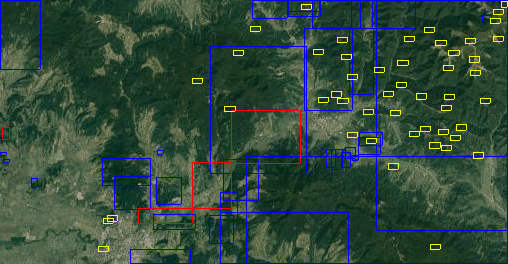

In [309]:
Image(filename='images/20.png')

In [310]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=31.6581,
                                       right_top_lon=49.2431,
                                       result_img_address="images/21.png",
                                       json_filename="jsons/21.json")

31.418199999999995 48.5455
401 45
196 553
(205, 508, 3)
31.6581 49.2431 31.418199999999995 48.5455
Counter({'water': 16})
0 water
{'maxlat': 31.6465952, 'minlat': 31.6455453, 'maxlon': 48.5941845, 'minlon': 48.589162}
10 11 35 32
1 water
{'maxlat': 31.6464666, 'minlat': 31.6402479, 'maxlon': 48.6060329, 'minlon': 48.5943194}
10 15 44 36
Going to show

2 water
{'maxlat': 31.6581, 'minlat': 31.6269356, 'maxlon': 48.6945798, 'minlon': 48.6556971}
0 27 109 80
Going to show

3 water
{'maxlat': 31.57916, 'minlat': 31.5775228, 'maxlon': 48.6769245, 'minlon': 48.6729446}
67 69 96 93
4 water
{'maxlat': 31.5684591, 'minlat': 31.56501, 'maxlon': 48.6971438, 'minlon': 48.6729778}
77 80 110 93
Going to show

5 water
{'maxlat': 31.5778255, 'minlat': 31.5653032, 'maxlon': 48.6829211, 'minlon': 48.6771292}
69 79 100 96
6 water
{'maxlat': 31.5966891, 'minlat': 31.5759493, 'maxlon': 48.791342, 'minlon': 48.7887317}
52 70 179 177
7 water
{'maxlat': 31.6054841, 'minlat': 31.5963395, 'maxlon': 48.8042148, 

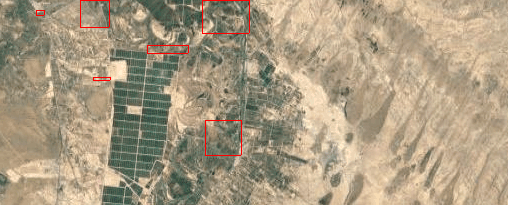

In [311]:
Image(filename='images/21.png')

In [312]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=39.6581,
                                       right_top_lon=49.2431,
                                       result_img_address="images/22.png",
                                       json_filename="jsons/22.json")

39.41819999999999 48.5455
412 45
185 553
(227, 508, 3)
39.6581 49.2431 39.41819999999999 48.5455
Counter({'water': 102, 'wood': 3})
0 water
{'maxlat': 39.4204563, 'minlat': 39.41819999999999, 'maxlon': 49.2431, 'minlon': 49.2308928}
225 226 507 499
1 water
{'maxlat': 39.4204563, 'minlat': 39.41819999999999, 'maxlon': 49.2309221, 'minlon': 49.1777706}
225 226 499 460
2 water
{'maxlat': 39.5514263, 'minlat': 39.5313008, 'maxlon': 49.0253705, 'minlon': 48.9999212}
101 120 349 331
Going to show

3 water
{'maxlat': 39.4360593, 'minlat': 39.41819999999999, 'maxlon': 49.1786045, 'minlon': 49.0984568}
210 226 461 403
Going to show

4 water
{'maxlat': 39.6004164, 'minlat': 39.5630153, 'maxlon': 48.998275, 'minlon': 48.9817901}
55 90 330 318
Going to show

5 water
{'maxlat': 39.6046729, 'minlat': 39.5992441, 'maxlon': 49.000932, 'minlon': 48.9982585}
51 56 332 330
6 water
{'maxlat': 39.573539, 'minlat': 39.5501967, 'maxlon': 49.0213124, 'minlon': 48.9982736}
80 102 346 330
Going to show

7 water

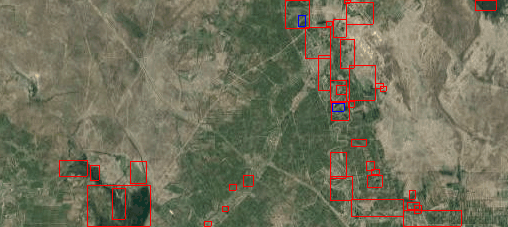

In [313]:
Image(filename='images/22.png')

In [314]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=35.6589,
                                       right_top_lon=59.2951,
                                       result_img_address="images/23.png",
                                       json_filename="jsons/23.json")

35.419 58.5975
406 46
192 554
(214, 508, 3)
{'type': 'node', 'id': 5326893507, 'lat': 35.5204319, 'lon': 58.8343322, 'tags': {'ele': '3030', 'name': 'قله ملکوه', 'natural': 'peak'}}
35.6589 59.2951 35.419 58.5975
Counter({'peak': 1})
0 peak
{'maxlat': 35.522830899999995, 'minlat': 35.5180329, 'maxlon': 58.8413082, 'minlon': 58.8273562}
121 126 178 167
Going to show

Wall time: 1.45 s


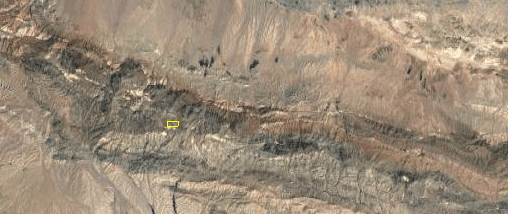

In [315]:
Image(filename='images/23.png')

In [316]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=42.8589,
                                       right_top_lon=59.2951,
                                       result_img_address="images/24.png",
                                       json_filename="jsons/24.json")

42.61899999999999 58.5975
418 46
180 554
(238, 508, 3)
42.8589 59.2951 42.61899999999999 58.5975
Counter({'water': 5, 'wood': 5})
0 water
{'maxlat': 42.8589, 'minlat': 42.8219592, 'maxlon': 59.2951, 'minlon': 59.2615618}
0 37 507 484
Going to show

1 water
{'maxlat': 42.6419294, 'minlat': 42.6405404, 'maxlon': 58.9388139, 'minlon': 58.9348764}
215 217 249 246
2 water
{'maxlat': 42.6408865, 'minlat': 42.6404803, 'maxlon': 58.9387488, 'minlon': 58.9366678}
216 217 249 247
3 water
{'maxlat': 42.640496, 'minlat': 42.640069, 'maxlon': 58.9386568, 'minlon': 58.9366324}
217 217 248 247
4 water
{'maxlat': 42.746032, 'minlat': 42.744346, 'maxlon': 58.9972597, 'minlon': 58.9900492}
112 114 291 286
5 wood
{'maxlat': 42.7516617, 'minlat': 42.7311518, 'maxlon': 59.284267, 'minlon': 59.2512837}
106 127 500 476
Going to show

6 wood
{'maxlat': 42.767667, 'minlat': 42.7426314, 'maxlon': 59.2803729, 'minlon': 59.2470706}
91 115 497 473
Going to show

7 wood
{'maxlat': 42.8242541, 'minlat': 42.7947698, 

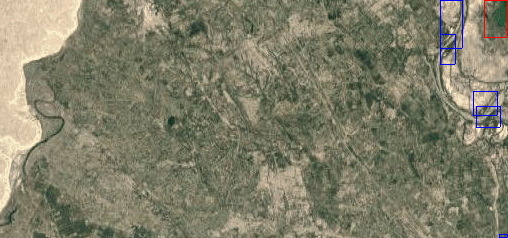

In [317]:
Image(filename='images/24.png')

In [318]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=59.5589,
                                       right_top_lon=42.2351,
                                       result_img_address="images/25.png",
                                       json_filename="jsons/25.json")

59.318999999999996 41.5375
470 45
127 553
(343, 508, 3)
59.5589 42.2351 59.318999999999996 41.5375
Counter({'wood': 6, 'water': 4})
0 water
{'maxlat': 59.4458423, 'minlat': 59.4385129, 'maxlon': 42.1218319, 'minlon': 42.1093747}
162 172 426 416
Going to show

1 water
{'maxlat': 59.5359508, 'minlat': 59.5340567, 'maxlon': 41.5464142, 'minlon': 41.5442025}
33 36 6 5
2 water
{'maxlat': 59.4899004, 'minlat': 59.4871114, 'maxlon': 42.0858122, 'minlon': 42.0815529}
99 103 399 396
3 water
{'maxlat': 59.4040459, 'minlat': 59.4010915, 'maxlon': 42.1513492, 'minlon': 42.1446336}
221 226 447 442
4 wood
{'maxlat': 59.4038339, 'minlat': 59.318999999999996, 'maxlon': 41.8304864, 'minlon': 41.5375}
222 342 213 0
Going to show

5 wood
{'maxlat': 59.4705618, 'minlat': 59.318999999999996, 'maxlon': 42.2351, 'minlon': 41.7379104}
126 342 507 146
Going to show

6 wood
{'maxlat': 59.5589, 'minlat': 59.4454665, 'maxlon': 42.2351, 'minlon': 42.0912502}
0 162 507 403
Going to show

7 wood
{'maxlat': 59.5589, 

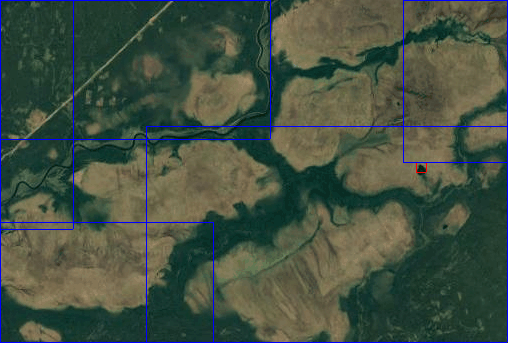

In [319]:
Image(filename='images/25.png')

In [320]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=23.5539,
                                       right_top_lon=57.2381,
                                       result_img_address="images/26.png",
                                       json_filename="jsons/26.json")

23.313999999999993 56.5405
394 45
204 553
(190, 508, 3)
{'type': 'node', 'id': 1721813044, 'lat': 23.33, 'lon': 57.03, 'tags': {'alt_name': 'جمة', 'int_name': 'Jammah, Jammah', 'name': 'جمة', 'name:ar': 'جمة', 'name:ar1': 'جمة', 'name:de': 'Jammah', 'name:en': 'Jammah', 'name:fr': 'Jammah', 'natural': 'water'}}
{'type': 'node', 'id': 1721807699, 'lat': 23.46, 'lon': 56.64, 'tags': {'alt_name': 'حورة خدل', 'int_name': 'Ḩawrat Khadil, Hawrat Khadil', 'name': 'حورة خدل', 'name:ar': 'حورة خدل', 'name:ar1': 'حورة خدل', 'name:de': 'Hawrat Khadil', 'name:en': 'Hawrat Khadil', 'name:fr': 'Hawrat Khadil', 'natural': 'peak'}}
{'type': 'node', 'id': 1721807700, 'lat': 23.44, 'lon': 56.66, 'tags': {'alt_name': 'حورة ملب', 'int_name': 'Ḩawrat Mulab, Hawrat Mulab', 'name': 'حورة ملب', 'name:ar': 'حورة ملب', 'name:ar1': 'حورة ملب', 'name:de': 'Hawrat Mulab', 'name:en': 'Hawrat Mulab', 'name:fr': 'Hawrat Mulab', 'natural': 'peak'}}
{'type': 'node', 'id': 1721807701, 'lat': 23.41, 'lon': 56.66, 'tags':

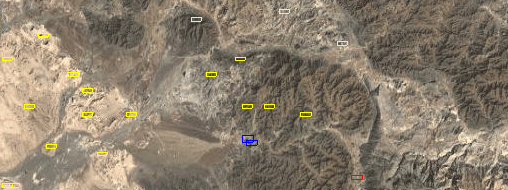

In [321]:
Image(filename='images/26.png')

In [322]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=57.5539,
                                       right_top_lon=23.2381,
                                       result_img_address="images/27.png",
                                       json_filename="jsons/27.json")

57.31399999999999 22.540499999999998
461 46
136 554
(325, 508, 3)
57.5539 23.2381 57.31399999999999 22.540499999999998
Counter({'water': 22, 'wood': 6})
0 water
{'maxlat': 57.3937629, 'minlat': 57.3360767, 'maxlon': 22.6447563, 'minlon': 22.5953468}
217 295 76 40
Going to show

1 water
{'maxlat': 57.4744697, 'minlat': 57.4706701, 'maxlon': 22.562018, 'minlon': 22.5583218}
108 113 16 13
2 water
{'maxlat': 57.4137459, 'minlat': 57.3745387, 'maxlon': 22.6632278, 'minlon': 22.618854}
190 243 89 57
Going to show

3 water
{'maxlat': 57.3275735, 'minlat': 57.3261508, 'maxlon': 22.8067912, 'minlon': 22.8037163}
307 309 194 192
4 water
{'maxlat': 57.3199716, 'minlat': 57.3166002, 'maxlon': 22.805787, 'minlon': 22.7928527}
317 321 193 184
Going to show

5 water
{'maxlat': 57.3501839, 'minlat': 57.3481373, 'maxlon': 22.7930963, 'minlon': 22.7845659}
276 279 184 178
6 water
{'maxlat': 57.3725722, 'minlat': 57.3699334, 'maxlon': 22.7756643, 'minlon': 22.7681061}
246 249 171 166
7 water
{'maxlat': 5

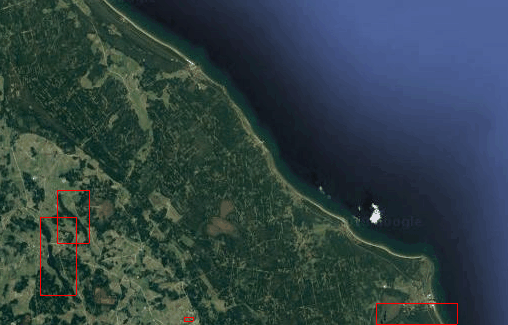

In [323]:
Image(filename='images/27.png')

In [324]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=52.5539,
                                       right_top_lon=25.2381,
                                       result_img_address="images/28.png",
                                       json_filename="jsons/28.json")

52.31399999999999 24.540499999999998
442 45
156 553
(286, 508, 3)
{'type': 'node', 'id': 5738091265, 'lat': 52.4078955, 'lon': 25.1505962, 'tags': {'ele': '152.3', 'name': 'Берестовец', 'name:ru': 'Берестовец', 'natural': 'peak'}}
52.5539 25.2381 52.31399999999999 24.540499999999998
Counter({'wood': 506, 'water': 158, 'peak': 1})
0 water
{'maxlat': 52.51791, 'minlat': 52.51636, 'maxlon': 25.01802, 'minlon': 25.01621}
43 45 348 346
1 water
{'maxlat': 52.5142877, 'minlat': 52.5138425, 'maxlon': 24.9584099, 'minlon': 24.9575619}
47 48 304 304
2 water
{'maxlat': 52.4189106, 'minlat': 52.4173706, 'maxlon': 25.0641127, 'minlon': 25.0614711}
161 163 381 379
3 water
{'maxlat': 52.4976483, 'minlat': 52.496591, 'maxlon': 24.5978113, 'minlon': 24.5940455}
67 68 42 39
4 water
{'maxlat': 52.4412898, 'minlat': 52.4405038, 'maxlon': 25.213638, 'minlon': 25.2103955}
134 135 490 488
5 water
{'maxlat': 52.439917, 'minlat': 52.439489, 'maxlon': 25.1896088, 'minlon': 25.1887149}
136 136 473 472
6 water
{'

154 156 461 459
143 water
{'maxlat': 52.4254246, 'minlat': 52.4232934, 'maxlon': 25.1745808, 'minlon': 25.1714265}
153 156 462 459
144 water
{'maxlat': 52.4257779, 'minlat': 52.4243696, 'maxlon': 25.1751119, 'minlon': 25.1723304}
153 154 462 460
145 water
{'maxlat': 52.4261181, 'minlat': 52.4249405, 'maxlon': 25.1754847, 'minlon': 25.1727167}
152 154 462 460
146 water
{'maxlat': 52.4264419, 'minlat': 52.4253641, 'maxlon': 25.1760882, 'minlon': 25.1730466}
152 153 463 461
147 water
{'maxlat': 52.4264223, 'minlat': 52.4259529, 'maxlon': 25.1763296, 'minlon': 25.1749429}
152 153 463 462
148 water
{'maxlat': 52.4267232, 'minlat': 52.4262473, 'maxlon': 25.174841, 'minlon': 25.1733577}
152 152 462 461
149 water
{'maxlat': 52.3983014, 'minlat': 52.397596, 'maxlon': 25.0254366, 'minlon': 25.0235134}
185 186 353 352
150 water
{'maxlat': 52.4538617, 'minlat': 52.4531817, 'maxlon': 24.9939662, 'minlon': 24.9928451}
119 120 330 329
151 water
{'maxlat': 52.4427585, 'minlat': 52.44242, 'maxlon': 25.

168 169 495 494
344 wood
{'maxlat': 52.5539, 'minlat': 52.3998755, 'maxlon': 25.2381, 'minlon': 25.2236409}
0 184 507 497
Going to show

345 wood
{'maxlat': 52.5539, 'minlat': 52.3998755, 'maxlon': 25.2381, 'minlon': 25.2236409}
0 184 507 497
Going to show

346 wood
{'maxlat': 52.5539, 'minlat': 52.3998755, 'maxlon': 25.2381, 'minlon': 25.2236409}
0 184 507 497
Going to show

347 wood
{'maxlat': 52.5539, 'minlat': 52.3998755, 'maxlon': 25.2381, 'minlon': 25.2236409}
0 184 507 497
Going to show

348 wood
{'maxlat': 52.5539, 'minlat': 52.3998755, 'maxlon': 25.2381, 'minlon': 25.2236409}
0 184 507 497
Going to show

349 wood
{'maxlat': 52.5539, 'minlat': 52.3998755, 'maxlon': 25.2381, 'minlon': 25.2236409}
0 184 507 497
Going to show

350 wood
{'maxlat': 52.5539, 'minlat': 52.3998755, 'maxlon': 25.2381, 'minlon': 25.2236409}
0 184 507 497
Going to show

351 wood
{'maxlat': 52.4475911, 'minlat': 52.4461394, 'maxlon': 25.1762396, 'minlon': 25.17317}
127 128 463 461
352 wood
{'maxlat': 52.54

{'maxlat': 52.5343413, 'minlat': 52.5301089, 'maxlon': 25.0204825, 'minlon': 25.0175643}
23 28 350 347
620 wood
{'maxlat': 52.5443056, 'minlat': 52.5299815, 'maxlon': 25.018959, 'minlon': 25.0122986}
11 29 348 344
621 wood
{'maxlat': 52.5383384, 'minlat': 52.5380252, 'maxlon': 25.0268018, 'minlon': 25.0260267}
19 19 354 354
622 wood
{'maxlat': 52.5382357, 'minlat': 52.5374885, 'maxlon': 25.0258148, 'minlon': 25.0249645}
19 20 353 353
623 wood
{'maxlat': 52.5447704, 'minlat': 52.5434099, 'maxlon': 25.0115461, 'minlon': 25.0085146}
11 13 343 341
624 wood
{'maxlat': 52.5538112, 'minlat': 52.552637, 'maxlon': 25.0054783, 'minlon': 25.0004303}
0 2 339 335
625 wood
{'maxlat': 52.524409, 'minlat': 52.5231785, 'maxlon': 24.92421, 'minlon': 24.9207848}
35 37 279 277
626 wood
{'maxlat': 52.5260751, 'minlat': 52.5247092, 'maxlon': 24.9197575, 'minlon': 24.9158013}
33 35 276 273
627 wood
{'maxlat': 52.5273072, 'minlat': 52.5260686, 'maxlon': 24.9156672, 'minlon': 24.9122179}
32 33 273 271
628 wood

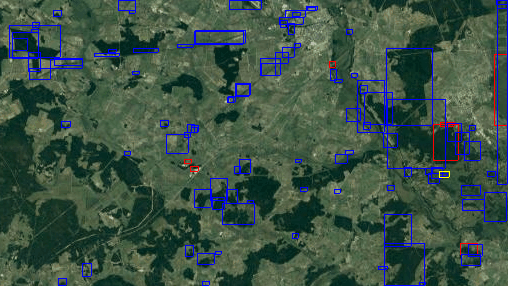

In [325]:
Image(filename='images/28.png')

In [326]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=13.5539,
                                       right_top_lon=15.2381,
                                       result_img_address="images/29.png",
                                       json_filename="jsons/29.json")

13.313999999999995 14.540499999999998
389 46
209 554
(180, 508, 3)
13.5539 15.2381 13.313999999999995 14.540499999999998
Counter({'water': 6})
0 water
{'maxlat': 13.4215141, 'minlat': 13.4104646, 'maxlon': 15.213769, 'minlon': 15.2040057}
99 108 490 483
Going to show

1 water
{'maxlat': 13.4300922, 'minlat': 13.4172771, 'maxlon': 15.2013879, 'minlon': 15.1908093}
93 103 481 474
Going to show

2 water
{'maxlat': 13.5077352, 'minlat': 13.461231, 'maxlon': 14.8731999, 'minlon': 14.8498581}
35 70 242 225
Going to show

3 water
{'maxlat': 13.4955632, 'minlat': 13.4937176, 'maxlon': 14.9162974, 'minlon': 14.9130549}
44 45 274 271
4 water
{'maxlat': 13.378935, 'minlat': 13.361126, 'maxlon': 15.0528261, 'minlon': 15.0373135}
131 145 373 362
Going to show

5 water
{'maxlat': 13.323731, 'minlat': 13.313999999999995, 'maxlon': 14.8539877, 'minlon': 14.8299551}
173 179 228 211
Going to show

Wall time: 1.56 s


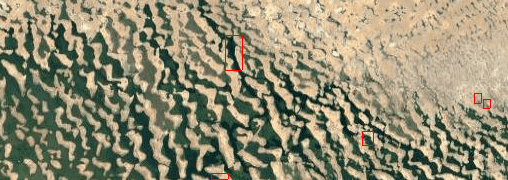

In [327]:
Image(filename='images/29.png')

In [328]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=23.5539,
                                       right_top_lon=45.2381,
                                       result_img_address="images/30.png",
                                       json_filename="jsons/30.json")

23.313999999999993 44.5405
394 46
204 554
(190, 508, 3)
{'type': 'node', 'id': 1236421325, 'lat': 23.527778, 'lon': 44.791944, 'tags': {'alt_name': 'جبل العبد', 'int_name': 'Jabal al Abd, Jabal al Abd', 'is_in': 'Saudi Arabia , المملكة العربية السعودية', 'name': 'جبل العبد', 'name:ar': 'جبل العبد', 'name:ar1': 'جبل العبد', 'name:de': 'Jabal al Abd', 'name:en': 'Jabal al Abd', 'name:fr': 'Jabal al Abd', 'natural': 'peak'}}
{'type': 'node', 'id': 1236421411, 'lat': 23.533333, 'lon': 45.083333, 'tags': {'alt_name': 'جبل منسة', 'int_name': 'Jabal Minassa, Jabal Minassa', 'is_in': 'Saudi Arabia , المملكة العربية السعودية', 'name': 'جبل منسة', 'name:ar': 'جبل منسة', 'name:ar1': 'جبل منسة', 'name:de': 'Jabal Minassa', 'name:en': 'Jabal Minassa', 'name:fr': 'Jabal Minassa', 'natural': 'peak'}}
{'type': 'node', 'id': 1236421457, 'lat': 23.552778, 'lon': 44.703056, 'tags': {'alt_name': 'جبل خرس', 'int_name': 'Jabal Khurs,Al Khurs,Al Khurş, Jabal Khurs', 'is_in': 'Saudi Arabia , المملكة العربية ا

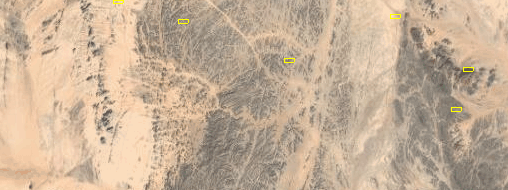

In [329]:
Image(filename='images/30.png')

In [330]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=47.5939,
                                       right_top_lon=65.2381,
                                       result_img_address="images/31.png",
                                       json_filename="jsons/31.json")

47.35399999999999 64.54050000000001
428 45
169 553
(259, 508, 3)
47.5939 65.2381 47.35399999999999 64.54050000000001
Counter({'water': 3})
0 water
{'maxlat': 47.537949, 'minlat': 47.5268225, 'maxlon': 64.6904182, 'minlon': 64.672737}
60 72 109 96
Going to show

1 water
{'maxlat': 47.5939, 'minlat': 47.5802893, 'maxlon': 64.715824, 'minlon': 64.6930789}
0 15 128 111
Going to show

2 water
{'maxlat': 47.5823735, 'minlat': 47.5554453, 'maxlon': 64.696598, 'minlon': 64.6492194}
12 42 114 79
Going to show

Wall time: 1.44 s


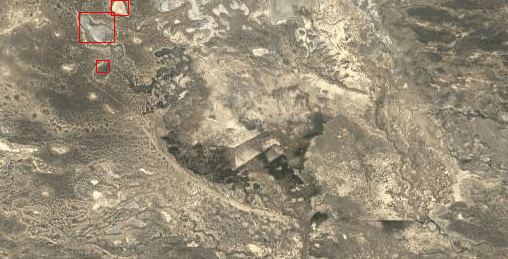

In [331]:
Image(filename='images/31.png')

In [332]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=37.5939,
                                       right_top_lon=45.2381,
                                       result_img_address="images/32.png",
                                       json_filename="jsons/32.json")

37.35399999999999 44.5405
409 46
189 554
(220, 508, 3)
{'type': 'node', 'id': 2307245938, 'lat': 37.3973428, 'lon': 44.6580517, 'tags': {'name': 'Sehidan Deresi', 'natural': 'peak', 'source': 'cyclemap'}}
37.5939 45.2381 37.35399999999999 44.5405
Counter({'water': 4, 'wood': 2, 'peak': 1})
0 water
{'maxlat': 37.5851879, 'minlat': 37.5833414, 'maxlon': 44.6397806, 'minlon': 44.6356249}
8 10 72 69
1 water
{'maxlat': 37.4592359, 'minlat': 37.4236338, 'maxlon': 44.9195855, 'minlon': 44.8407017}
123 156 276 219
Going to show

2 water
{'maxlat': 37.4405996, 'minlat': 37.4397057, 'maxlon': 45.1212883, 'minlon': 45.1203171}
141 141 423 422
3 water
{'maxlat': 37.5370358, 'minlat': 37.5358304, 'maxlon': 45.0981377, 'minlon': 45.0958361}
52 53 406 404
4 wood
{'maxlat': 37.5487894, 'minlat': 37.5480888, 'maxlon': 45.0235432, 'minlon': 45.0225226}
41 42 352 351
5 wood
{'maxlat': 37.5484741, 'minlat': 37.547735, 'maxlon': 45.0234548, 'minlon': 45.022262}
42 42 352 351
6 peak
{'maxlat': 37.3997417999

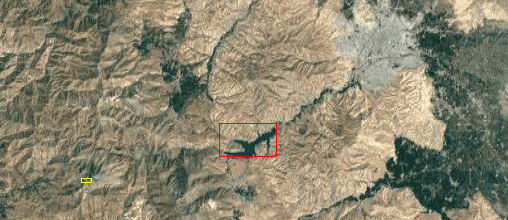

In [333]:
Image(filename='images/32.png')

In [334]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=51.5939,
                                       right_top_lon=63.2381,
                                       result_img_address="images/33.png",
                                       json_filename="jsons/33.json")

51.35399999999999 62.5405
439 45
158 553
(281, 508, 3)
51.5939 63.2381 51.35399999999999 62.5405
Counter({'water': 20})
0 water
{'maxlat': 51.4427592, 'minlat': 51.4260782, 'maxlon': 62.9388303, 'minlon': 62.9084891}
177 197 290 268
Going to show

1 water
{'maxlat': 51.3864057, 'minlat': 51.3693692, 'maxlon': 62.9210186, 'minlon': 62.8829098}
243 263 277 249
Going to show

2 water
{'maxlat': 51.380165, 'minlat': 51.35399999999999, 'maxlon': 62.8327417, 'minlon': 62.7765226}
250 280 213 172
Going to show

3 water
{'maxlat': 51.3854415, 'minlat': 51.3767631, 'maxlon': 62.745924, 'minlon': 62.7263546}
244 254 150 135
Going to show

4 water
{'maxlat': 51.3628315, 'minlat': 51.35399999999999, 'maxlon': 62.9222202, 'minlon': 62.885313}
271 280 278 251
Going to show

5 water
{'maxlat': 51.4528837, 'minlat': 51.3925115, 'maxlon': 63.2381, 'minlon': 63.1400585}
165 236 507 437
Going to show

6 water
{'maxlat': 51.399045, 'minlat': 51.3934756, 'maxlon': 63.1290722, 'minlon': 63.1167126}
228 235 

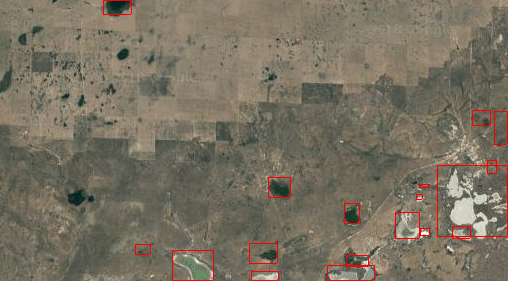

In [335]:
Image(filename='images/33.png')

In [336]:
%%time
load_data_and_draw_rectangles_on_image(right_top_lat=41.5939,
                                       right_top_lon=53.2381,
                                       result_img_address="images/34.png",
                                       json_filename="jsons/34.json")

41.35399999999999 52.5405
415 45
182 553
(233, 508, 3)
41.5939 53.2381 41.35399999999999 52.5405
Counter({'water': 2})
0 water
{'maxlat': 41.5903451, 'minlat': 41.5707381, 'maxlon': 52.7035055, 'minlon': 52.6240602}
3 22 119 61
Going to show

1 water
{'maxlat': 41.5739042, 'minlat': 41.5730824, 'maxlon': 52.6305018, 'minlon': 52.6270533}
19 20 66 63
Wall time: 3.09 s


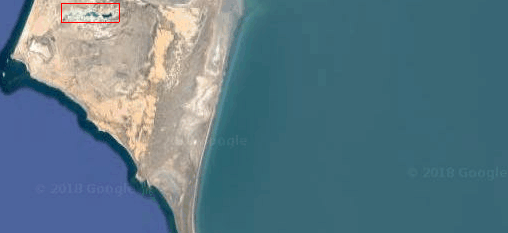

In [337]:
Image(filename='images/34.png')